# SAMPLE CREDIT SCORING MODEL

## I. Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib

import matplotlib.pyplot as plt
%matplotlib inline
import os
import warnings
import seaborn as sns
import plotly.graph_objs as go
import plotly.figure_factory as ff

from sklearn import preprocessing
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.model_selection import train_test_split


## II. Data detail
* Thời gian giải ngân tháng 8 đến tháng 12 năm 2020.
* Định nghĩa nợ xấu: DPD 20.
* Trạng thái nợ xấu lấy tại thời điểm cuối Tháng 5 năm 2021

## III. Data load and Preprocessing

In [2]:
loan_data = pd.read_csv('Data_Regression_20220817.csv')

In [3]:
loan_data.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1
1,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1
2,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1
3,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1
4,177453,7,56,6,2,0,5,2,2,AE1,8/7/2020 0:00,0,1,1


In [4]:
loan_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10962 entries, 0 to 10961
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   contractId          10962 non-null  int64 
 1   education           10962 non-null  int64 
 2   Age                 10962 non-null  int64 
 3   businessType        10962 non-null  int64 
 4   numberOfDependents  10962 non-null  int64 
 5   numberOfStaff       10962 non-null  int64 
 6   businessSite        10962 non-null  int64 
 7   maritalStatus       10962 non-null  int64 
 8   houseOwnership      10962 non-null  int64 
 9   businessCode        10962 non-null  object
 10  Ngaymo              10962 non-null  object
 11  DPD                 10962 non-null  int64 
 12  Status              10962 non-null  int64 
 13  RN                  10962 non-null  int64 
dtypes: int64(12), object(2)
memory usage: 1.2+ MB


In [5]:
loan_data.describe()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,DPD,Status,RN
count,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.000000,10962.0
mean,205366.165572,6.890805,42.182266,3.754516,1.892720,66.157635,4.539683,2.402755,2.338898,20.898924,0.856504,1.0
std,13293.488135,1.029901,56.611740,0.950197,0.957249,2623.029247,1.219584,0.787807,1.888121,55.392628,0.350594,0.0
min,174336.000000,1.000000,-5175.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,-32.000000,0.000000,1.0
25%,194261.250000,7.000000,35.000000,3.000000,1.000000,0.000000,5.000000,2.000000,1.000000,0.000000,1.000000,1.0
50%,205906.000000,7.000000,42.000000,4.000000,2.000000,0.000000,5.000000,2.000000,2.000000,0.000000,1.000000,1.0
75%,216393.250000,7.000000,50.000000,4.000000,3.000000,1.000000,5.000000,2.000000,2.000000,0.000000,1.000000,1.0
max,229473.000000,11.000000,1832.000000,6.000000,5.000000,143019.000000,6.000000,5.000000,6.000000,290.000000,1.000000,1.0


In [6]:
pd.options.display.max_columns = None
#pd.options.display.max_rows = None
# Sets the pandas dataframe options to display all columns/ rows.

In [7]:
pd.options.display.max_rows = None

In [8]:
mapping_df = pd.read_csv('Mapping_MulitpleVariables.csv')

In [9]:
mapping_df.head()

,Name,Score_info,CRM_value,Scoring_variable
0,MaritalStatus,1,Chuẩn bị kết hôn,single
1,MaritalStatus,2,Có gia đình,married
2,MaritalStatus,3,Độc thân,single
3,MaritalStatus,4,Đã Li dị,divorced
4,MaritalStatus,5,Quá,widowed


In [10]:
mapping_df['Name'].unique()

array(['MaritalStatus', 'BusinessCode', 'businessType', 'BusinesSite',
       'EducationLevel', 'HouseOwnership'], dtype=object)

In [11]:
mapping_df_MaritalStatus = mapping_df[mapping_df['Name'] == 'MaritalStatus']

In [12]:
mapping_df_MaritalStatus

,Name,Score_info,CRM_value,Scoring_variable
0,MaritalStatus,1,Chuẩn bị kết hôn,single
1,MaritalStatus,2,Có gia đình,married
2,MaritalStatus,3,Độc thân,single
3,MaritalStatus,4,Đã Li dị,divorced
4,MaritalStatus,5,Quá,widowed


In [13]:
mapping_df_BusinessCode = mapping_df[mapping_df['Name'] == 'BusinessCode']
mapping_df_BusinessCode

,Name,Score_info,CRM_value,Scoring_variable
5,BusinessCode,A1,A1,medium
6,BusinessCode,A2,A2,medium
7,BusinessCode,A3,A3,medium
8,BusinessCode,A4,A4,medium
9,BusinessCode,A5,A5,medium
10,BusinessCode,A6,A6,medium
11,BusinessCode,A7,A7,medium
12,BusinessCode,A8,A8,medium
13,BusinessCode,A9,A9,medium
14,BusinessCode,B1,B1,high


In [14]:
mapping_df_businessType = mapping_df[mapping_df['Name'] == 'businessType']
mapping_df_businessType

,Name,Score_info,CRM_value,Scoring_variable
97,businessType,6,Khác,Other
98,businessType,4,Bán lẻ,Retail
99,businessType,5,Dịch vụ,Service
100,businessType,3,Bán buôn,Wholesale
101,businessType,2,Gia công,Manufacturing
102,businessType,1,Sản xuất,Manufacturing


In [15]:
mapping_df_BusinesSite = mapping_df[mapping_df['Name'] == 'BusinesSite']
mapping_df_BusinesSite

,Name,Score_info,CRM_value,Scoring_variable
103,BusinesSite,6,Khác,Other
104,BusinesSite,4,Lưu động (> 6 bàn ghế),Mobile stall
105,BusinesSite,5,Trong nhà (1 MB),Store
106,BusinesSite,3,Lưu dộng (<= 6 bàn ghế),Mobile stall
107,BusinesSite,2,Trong chợ,Market
108,BusinesSite,1,Mua mang đi,Other


In [16]:
mapping_df_EducationLevel = mapping_df[mapping_df['Name'] == 'EducationLevel']
mapping_df_EducationLevel

,Name,Score_info,CRM_value,Scoring_variable
109,EducationLevel,1,Không biết chữ,Primary
110,EducationLevel,5,Cấp 1,Primary
111,EducationLevel,5,Dưới phổ thông,Primary
112,EducationLevel,6,Cấp 2,Secondary
113,EducationLevel,7,Phổ thông,High school
114,EducationLevel,7,Cấp 3,High school
115,EducationLevel,9,Trên phổ thông,College
116,EducationLevel,9,Cao đẳng,College
117,EducationLevel,10,Đại học,College
118,EducationLevel,11,Trên đại học,College


In [17]:
mapping_df_HouseOwnership = mapping_df[mapping_df['Name'] == 'HouseOwnership']
mapping_df_HouseOwnership

,Name,Score_info,CRM_value,Scoring_variable
119,HouseOwnership,6,Nhà của gia đình,Family
120,HouseOwnership,3,"Ở nhờ, ở ghép",Rent
121,HouseOwnership,2,Thuê,Rent
122,HouseOwnership,1,Sở hữu,Owned


In [18]:
# Merge the raw data with the mapping data
mapping_df_MaritalStatus['Score_info']=mapping_df_MaritalStatus['Score_info'].astype(int)
loan_data_map = pd.merge(loan_data, mapping_df_MaritalStatus, how='left', left_on = 'maritalStatus', right_on = 'Score_info')
loan_data_map.drop(['Name', 'Score_info'], axis=1, inplace=True)
loan_data_map.rename(columns = {'CRM_value': 'CRM_MaritalStatus', 'Scoring_variable': 'Scoring_MaritalStatus'}, inplace = True)
loan_data_map.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married
1,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married
2,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1,Đã Li dị,divorced
3,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced
4,177453,7,56,6,2,0,5,2,2,AE1,8/7/2020 0:00,0,1,1,Có gia đình,married


In [19]:
#mapping_df_BusinessCode['Score_info']=mapping_df_BusinessCode['Score_info'].astype(int)
loan_data_map = pd.merge(loan_data_map, mapping_df_BusinessCode, how='left', left_on = 'businessCode', right_on = 'Score_info')
loan_data_map.drop(['Name', 'Score_info'], axis=1, inplace=True)
loan_data_map.rename(columns = {'CRM_value': 'CRM_BusinessCode', 'Scoring_variable': 'Scoring_BusinessCode'}, inplace = True)
loan_data_map.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN
1,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN
2,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN
3,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN
4,177453,7,56,6,2,0,5,2,2,AE1,8/7/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN


In [20]:
mapping_df_businessType['Score_info']=mapping_df_businessType['Score_info'].astype(int)
loan_data_map = pd.merge(loan_data_map, mapping_df_businessType, how='left', left_on = 'businessType', right_on = 'Score_info')
loan_data_map.drop(['Name', 'Score_info'], axis=1, inplace=True)
loan_data_map.rename(columns = {'CRM_value': 'CRM_businessType', 'Scoring_variable': 'Scoring_businessType'}, inplace = True)
loan_data_map.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN,Bán buôn,Wholesale
1,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Bán lẻ,Retail
2,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán buôn,Wholesale
3,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail
4,177453,7,56,6,2,0,5,2,2,AE1,8/7/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Khác,Other


In [21]:
mapping_df_BusinesSite['Score_info']=mapping_df_BusinesSite['Score_info'].astype(int)
loan_data_map = pd.merge(loan_data_map, mapping_df_BusinesSite, how='left', left_on = 'businessSite', right_on = 'Score_info')
loan_data_map.drop(['Name', 'Score_info'], axis=1, inplace=True)
loan_data_map.rename(columns = {'CRM_value': 'CRM_BusinesSite', 'Scoring_variable': 'Scoring_BusinesSite'}, inplace = True)
loan_data_map.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType,CRM_BusinesSite,Scoring_BusinesSite
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market
1,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Bán lẻ,Retail,Khác,Other
2,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market
3,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other
4,177453,7,56,6,2,0,5,2,2,AE1,8/7/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Khác,Other,Trong nhà (1 MB),Store


In [22]:
mapping_df_EducationLevel['Score_info']=mapping_df_EducationLevel['Score_info'].astype(int)
loan_data_map = pd.merge(loan_data_map, mapping_df_EducationLevel, how='left', left_on = 'education', right_on = 'Score_info')
loan_data_map.drop(['Name', 'Score_info'], axis=1, inplace=True)
loan_data_map.rename(columns = {'CRM_value': 'CRM_EducationLevel', 'Scoring_variable': 'Scoring_EducationLevel'}, inplace = True)
loan_data_map.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType,CRM_BusinesSite,Scoring_BusinesSite,CRM_EducationLevel,Scoring_EducationLevel
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market,Phổ thông,High school
1,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market,Cấp 3,High school
2,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Bán lẻ,Retail,Khác,Other,Phổ thông,High school
3,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Bán lẻ,Retail,Khác,Other,Cấp 3,High school
4,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market,Phổ thông,High school


In [23]:
mapping_df_HouseOwnership['Score_info']=mapping_df_HouseOwnership['Score_info'].astype(int)
loan_data_map = pd.merge(loan_data_map, mapping_df_HouseOwnership, how='left', left_on = 'houseOwnership', right_on = 'Score_info')
loan_data_map.drop(['Name', 'Score_info'], axis=1, inplace=True)
loan_data_map.rename(columns = {'CRM_value': 'CRM_HouseOwnership', 'Scoring_variable': 'Scoring_HouseOwnership'}, inplace = True)
loan_data_map.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType,CRM_BusinesSite,Scoring_BusinesSite,CRM_EducationLevel,Scoring_EducationLevel,CRM_HouseOwnership,Scoring_HouseOwnership
0,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market,Phổ thông,High school,Nhà của gia đình,Family
1,174336,7,60,3,1,0,2,2,6,AI7,8/7/2020 0:00,202,0,1,Có gia đình,married,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market,Cấp 3,High school,Nhà của gia đình,Family
2,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Bán lẻ,Retail,Khác,Other,Phổ thông,High school,Sở hữu,Owned
3,174397,7,28,4,2,0,6,2,1,AI7,8/5/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Bán lẻ,Retail,Khác,Other,Cấp 3,High school,Sở hữu,Owned
4,175389,7,65,3,1,0,2,4,1,AD2,8/19/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán buôn,Wholesale,Trong chợ,Market,Phổ thông,High school,Sở hữu,Owned


In [24]:
loan_data_map.head().to_csv('loan_data_map.head.csv')

## IV. Performing EDA with the variables


Step 0: Check the number of goods/bads in the data

Step 1: visualization for each individual variable

One common approach is that we check the distribution using a histogram plot or boxplot for continuous variable and countplot (bar plot) or a pie chart for discrete variable.

The list of the continuous variables are as follows:
* Age
* numberOfDependents
* numberOfStaff

The list of the variables are categorical variables, the list is as follows:
* education
* businessType
* businessSite
* maritalStatus
* houseOwnership
* businessCode

Step 2: visualization by loan status as hue (for loans that are default vs loans that are not default)

Step 3: Check the statistics for each variable by using df_num.describe().T.round(2)

Step 4: check the correlation of each variable with each other using 2 methods:
* Pairplot
* Pairplot with loan status as hue
* correlation function then visualize with heatmap

Step 5: create cross-tab table to see if a variable have power in determining good or bad

### Step 0: Check the number of goods/bads in the data

In [25]:
loan_data_map["Status"].describe()

count    20163.000000
mean         0.859991
std          0.347005
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: Status, dtype: float64

In [26]:
loan_data_map.Status.value_counts() / len(loan_data_map) * 100

1    85.999107
0    14.000893
Name: Status, dtype: float64

In [27]:
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo

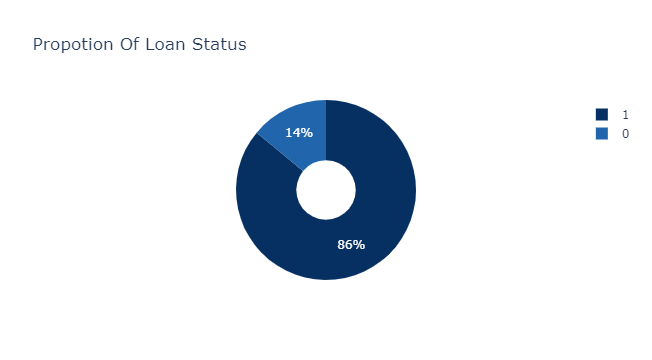

In [28]:
px.pie(loan_data_map,names='Status',title='Propotion Of Loan Status',hole=0.33, color_discrete_sequence= px.colors.sequential.RdBu_r)

### Step 1: visualization for each individual variable

One common approach is that we check the distribution using a histogram plot or boxplot for continuous variable and countplot (bar plot) or a pie chart for discrete variable.

The list of the continuous variables are as follows:
* Age
* numberOfDependents
* numberOfStaff

The list of the variables are categorical variables, the list is as follows:
* education
* businessType
* businessSite
* maritalStatus
* houseOwnership
* businessCode

#### For continuous variables

In [29]:
age_hi = loan_data_map['Age'].quantile(0.99)
age_low = loan_data_map['Age'].quantile(0.01)

staff_hi = loan_data_map['numberOfStaff'].quantile(0.99)
staff_low = loan_data_map['numberOfStaff'].quantile(0.01)

loan_data_map_filter = loan_data_map[(loan_data_map['Age'] < age_hi) 
                                     & (loan_data_map['Age'] > age_low)
                                     & (loan_data_map['numberOfStaff'] < staff_hi)
                                     & (loan_data_map['numberOfStaff'] > staff_low)
                                    ]

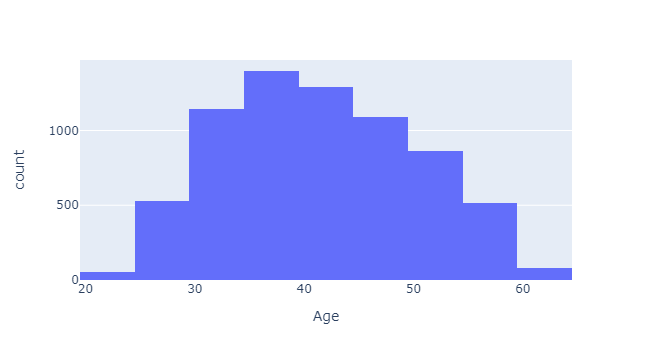

In [30]:
fig = px.histogram(loan_data_map_filter['Age'], x="Age", nbins=10)
fig.show()

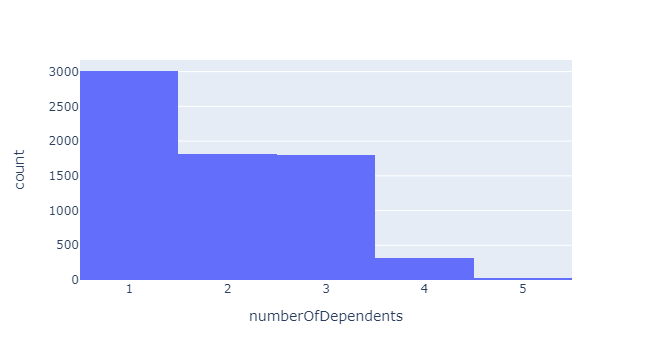

In [31]:
fig = px.histogram(loan_data_map_filter['numberOfDependents'], x="numberOfDependents")
fig.show()

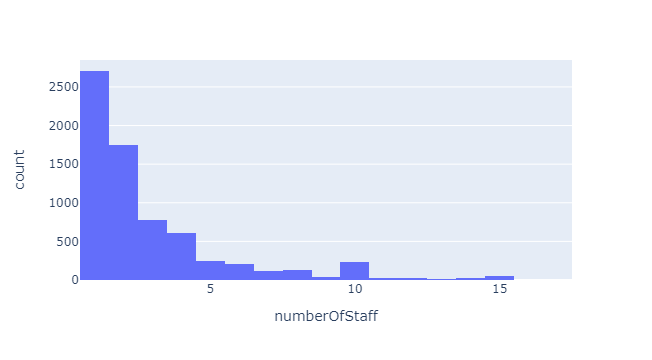

In [32]:
fig = px.histogram(loan_data_map_filter['numberOfStaff'], x="numberOfStaff")
fig.show()

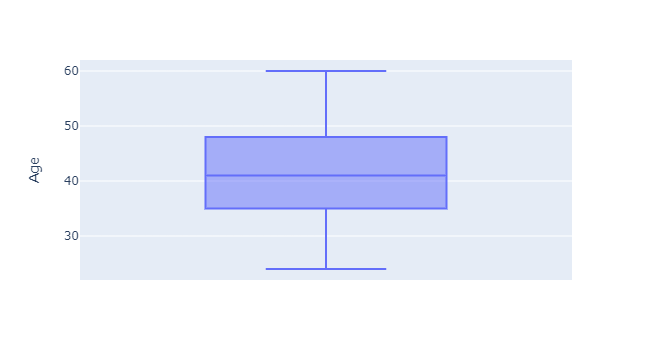

In [33]:
fig = px.box(loan_data_map_filter['Age'], y="Age")
fig.show()

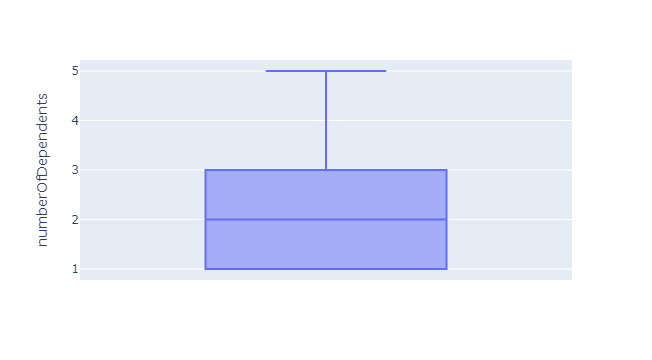

In [34]:
fig = px.box(loan_data_map_filter['numberOfDependents'], y="numberOfDependents")
fig.show()

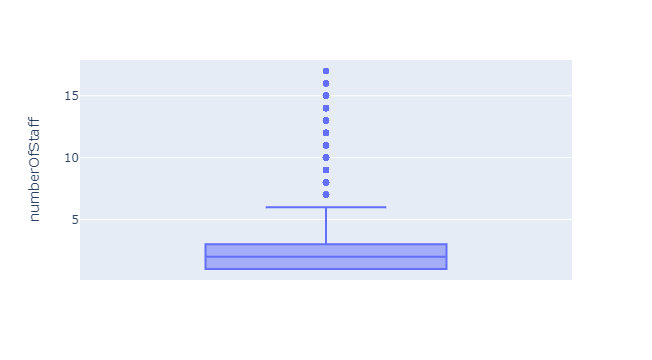

In [35]:
fig = px.box(loan_data_map_filter['numberOfStaff'], y="numberOfStaff")
fig.show()

#### For categorical variables

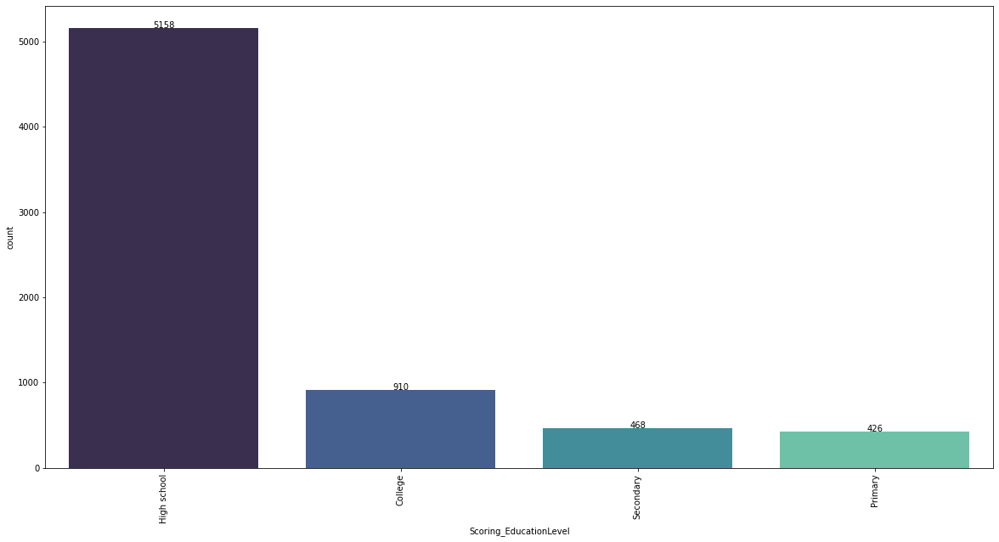

In [36]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_EducationLevel', data=loan_data_map_filter, palette="mako" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

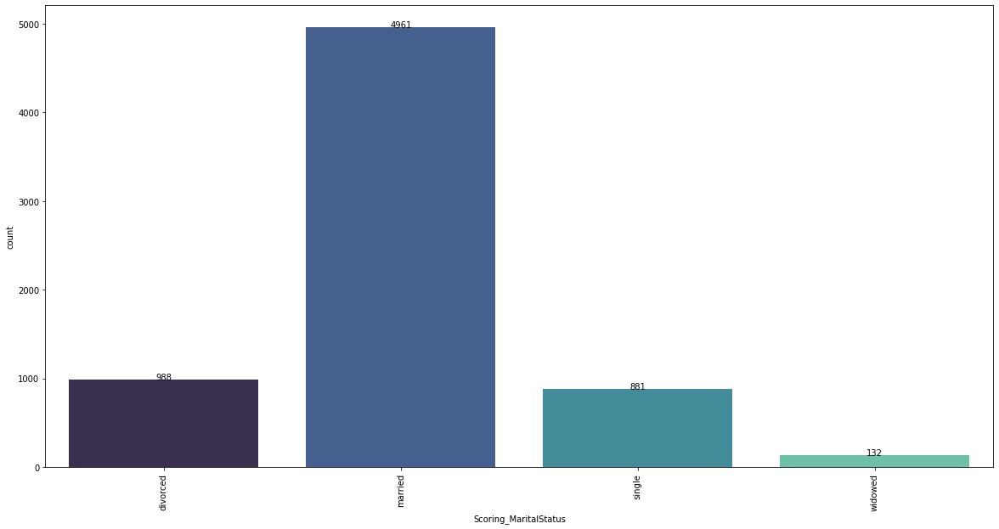

In [37]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_MaritalStatus', data=loan_data_map_filter, palette="mako" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

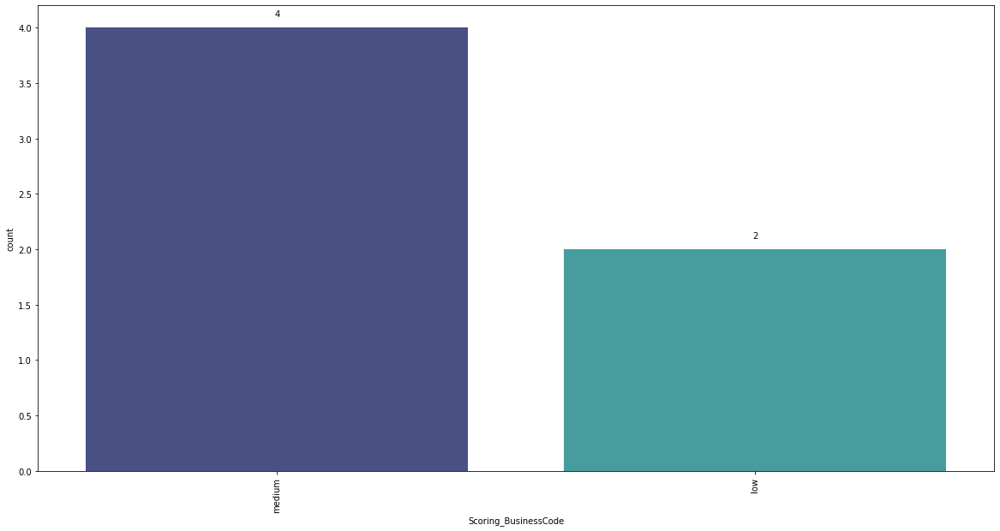

In [38]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_BusinessCode', data=loan_data_map_filter, palette="mako" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

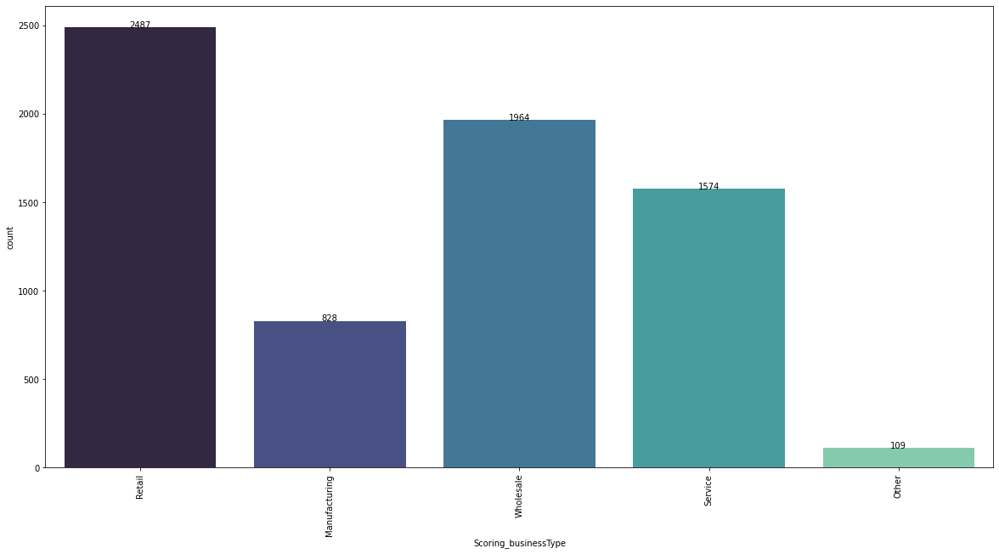

In [39]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_businessType', data=loan_data_map_filter, palette="mako" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

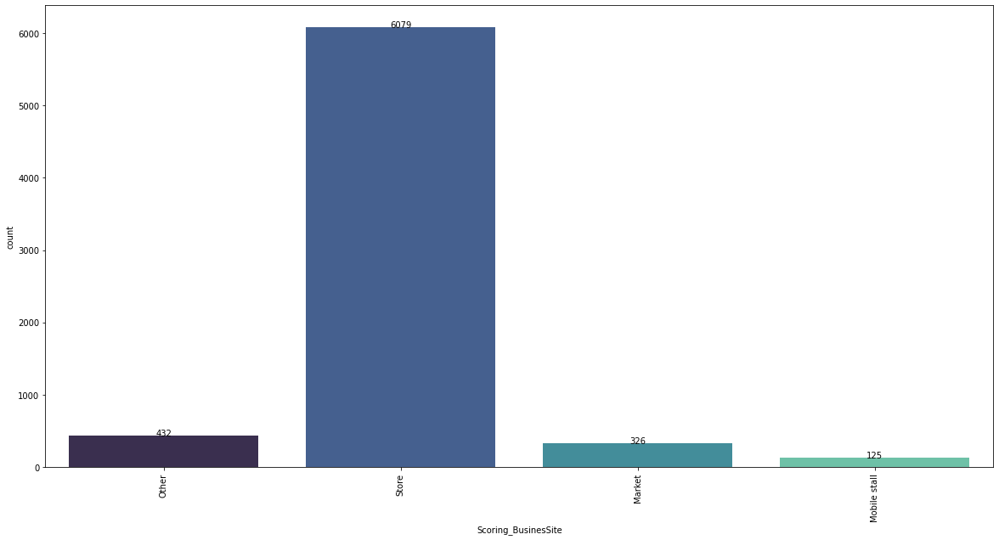

In [40]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_BusinesSite', data=loan_data_map_filter, palette="mako" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

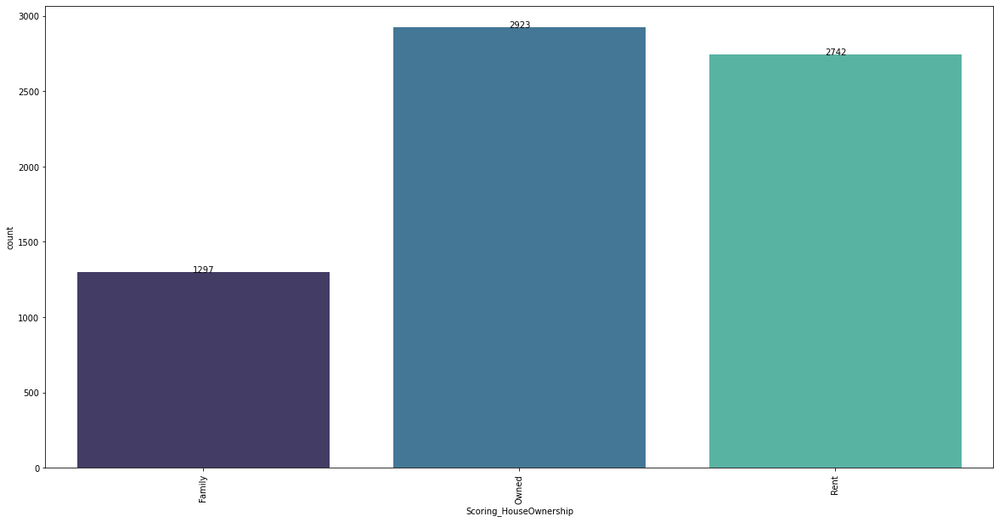

In [41]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_HouseOwnership', data=loan_data_map_filter, palette="mako" )
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

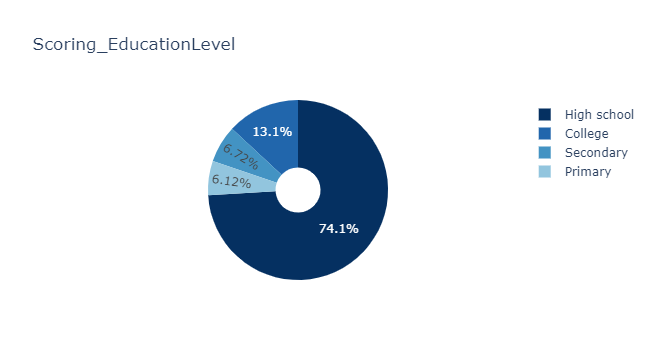

In [42]:
px.pie(loan_data_map_filter, names='Scoring_EducationLevel', title='Scoring_EducationLevel', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

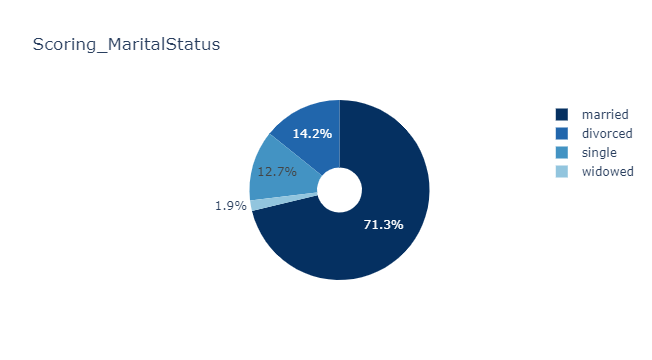

In [43]:
px.pie(loan_data_map_filter, names='Scoring_MaritalStatus', title='Scoring_MaritalStatus', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

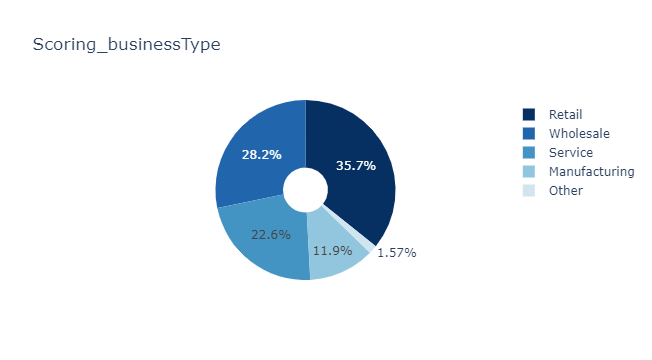

In [44]:
px.pie(loan_data_map_filter, names='Scoring_businessType', title='Scoring_businessType', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

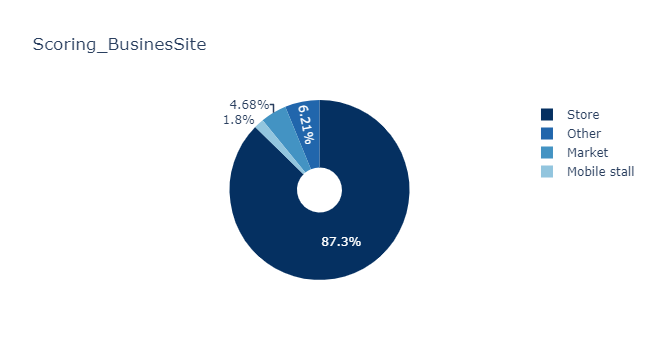

In [45]:
px.pie(loan_data_map_filter, names='Scoring_BusinesSite', title='Scoring_BusinesSite', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

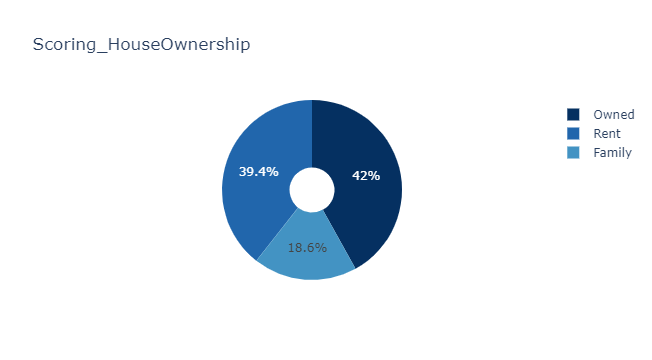

In [46]:
px.pie(loan_data_map_filter, names='Scoring_HouseOwnership', title='Scoring_HouseOwnership', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

### Step 2: visualization by loan status as hue (for loans that are default vs loans that are not default)

We apply the same graph as above but separate out the visulizations for bad debts and good debts to see if there is visible differences.

Note: when performing such visualization it is better practice to include both the goods and the bads in the same plot. 

As result it is better to create a fig with multiple plots in the same frame. To do this Seaborn is actually better in creating bar charts as they are included in the same fig



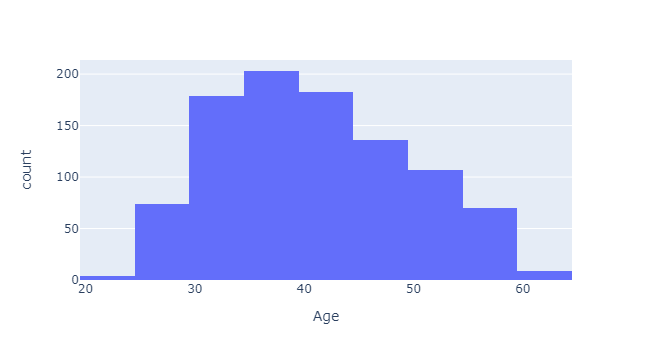

In [47]:
fig = px.histogram(loan_data_map_filter[loan_data_map_filter['Status'] == 0], x="Age", nbins=10)
fig.show()

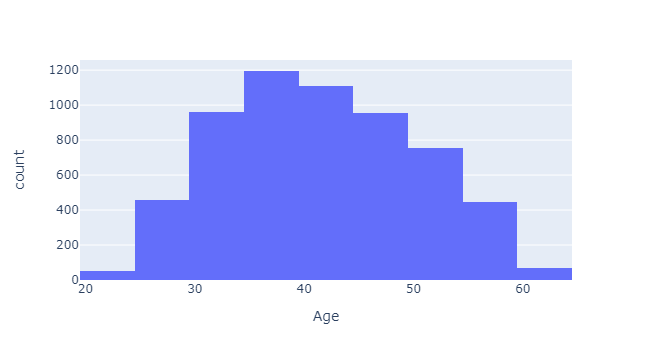

In [48]:
fig = px.histogram(loan_data_map_filter[loan_data_map_filter['Status'] == 1], x="Age", nbins=10)
fig.show()

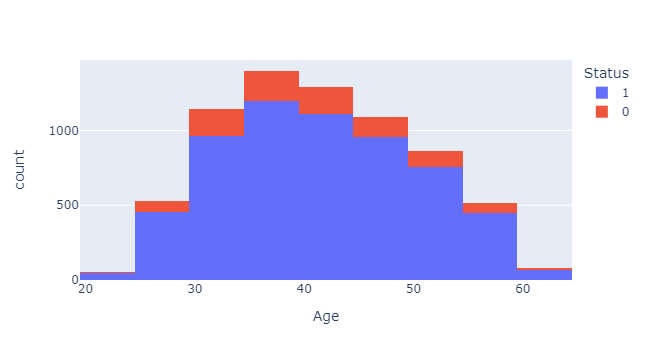

In [49]:
fig = px.histogram(loan_data_map_filter, x="Age", color = 'Status', nbins=10)
fig.show()

From this graph the customers with age of 45 and above is less likely to default

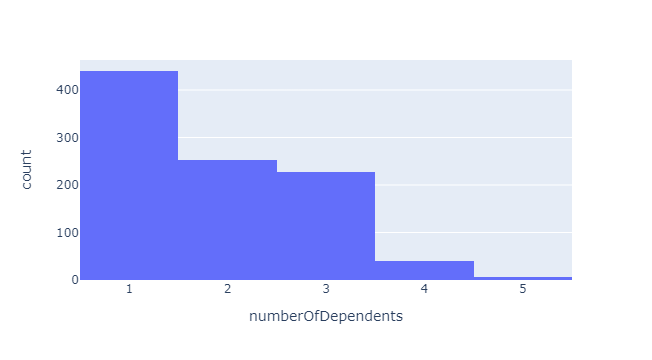

In [50]:
fig = px.histogram(loan_data_map_filter[loan_data_map_filter['Status']==0], x="numberOfDependents")
fig.show()

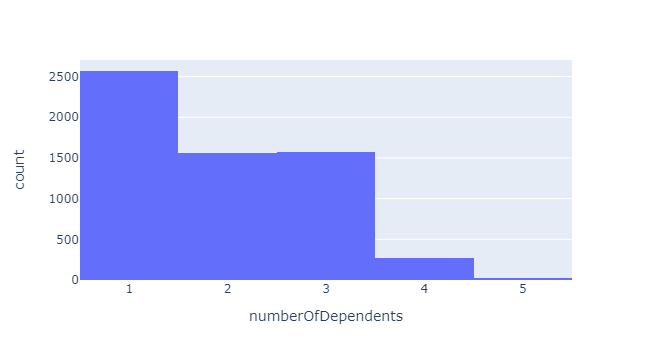

In [51]:
fig = px.histogram(loan_data_map_filter[loan_data_map_filter['Status']==1], x="numberOfDependents")
fig.show()

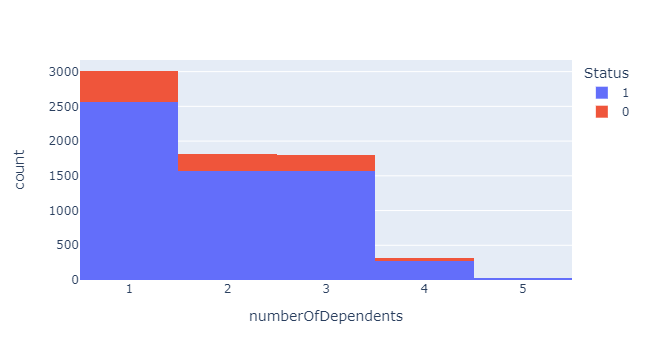

In [52]:
fig = px.histogram(loan_data_map_filter, x="numberOfDependents", color = 'Status')
fig.show()

Number of dependents do not have much difference for bad debt between 1,2,3 dependents

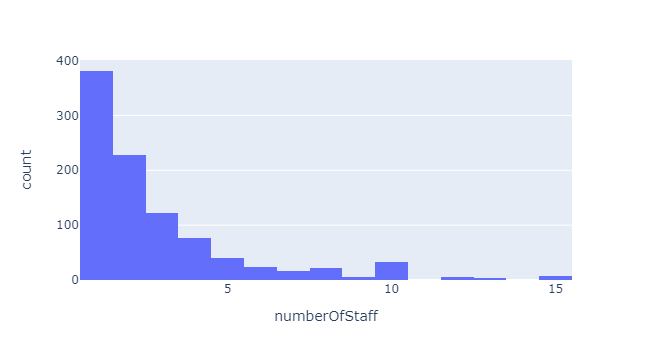

In [53]:
fig = px.histogram(loan_data_map_filter[loan_data_map_filter['Status']==0], x="numberOfStaff")
fig.show()

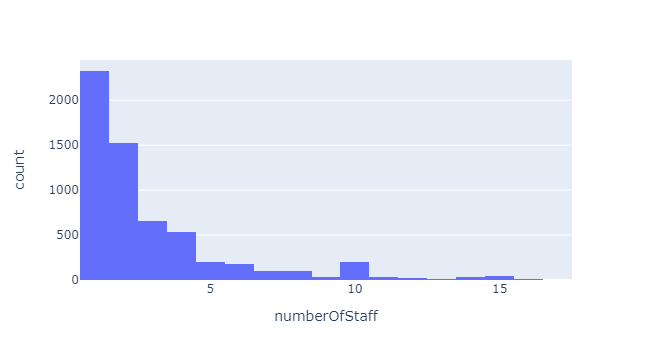

In [54]:
fig = px.histogram(loan_data_map_filter[loan_data_map_filter['Status']==1], x="numberOfStaff")
fig.show()

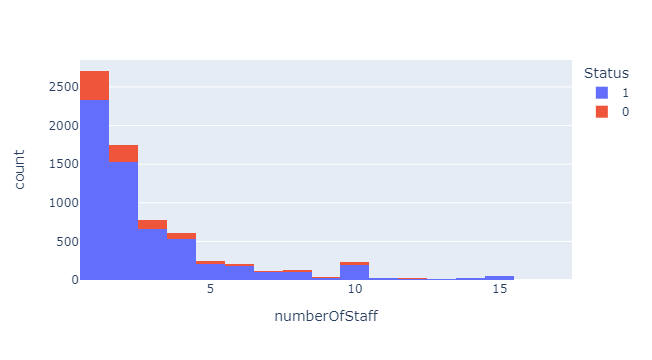

In [55]:
fig = px.histogram(loan_data_map_filter, x="numberOfStaff", color = "Status")
fig.show()

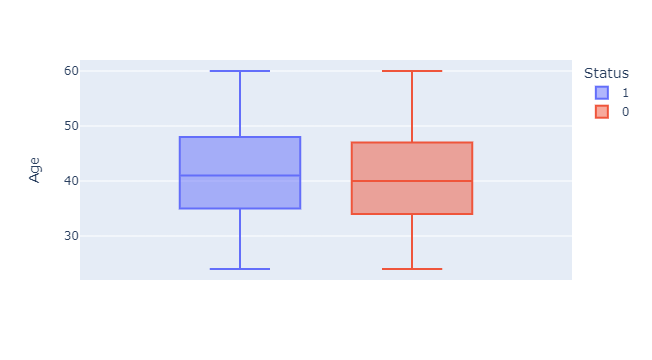

In [56]:
fig = px.box(loan_data_map_filter, y="Age", color = 'Status')
fig.show()

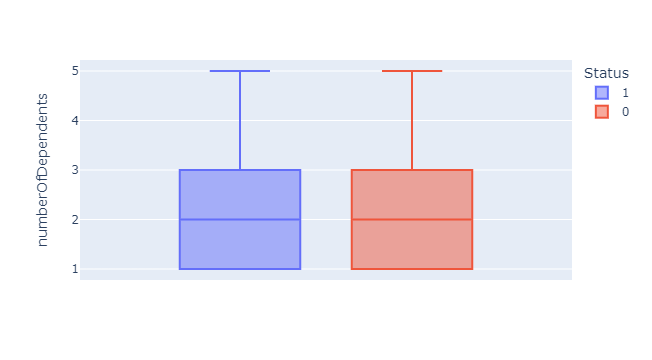

In [57]:
fig = px.box(loan_data_map_filter, y="numberOfDependents", color = 'Status')
fig.show()

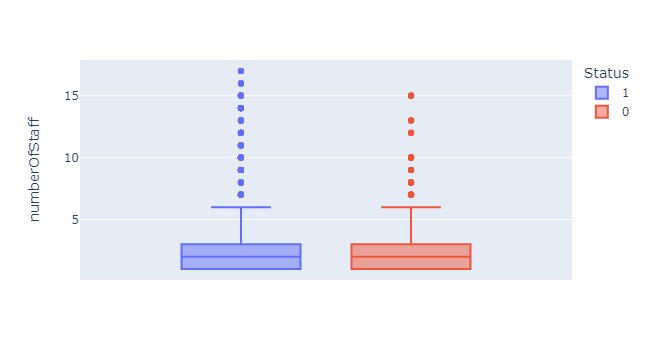

In [58]:
fig = px.box(loan_data_map_filter, y="numberOfStaff", color = 'Status')
fig.show()

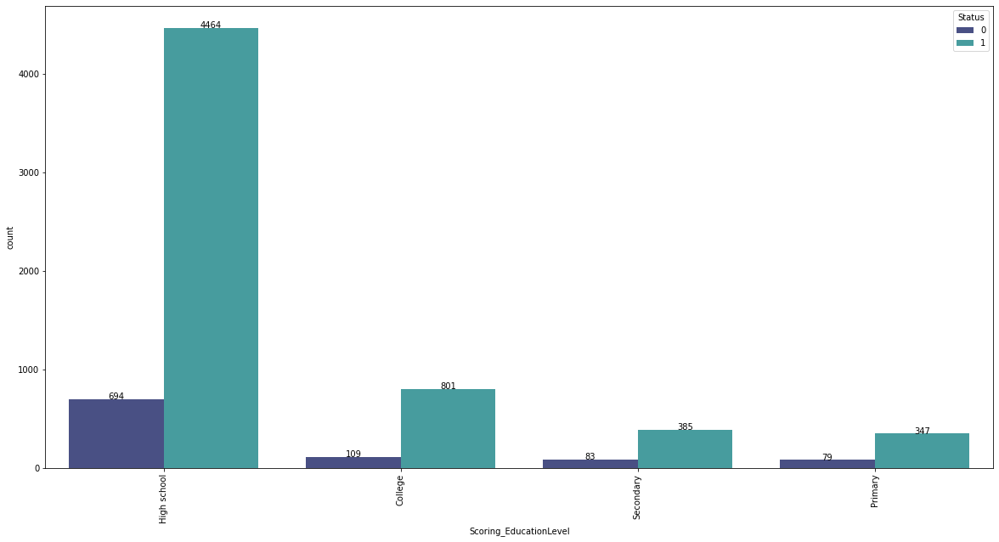

In [59]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_EducationLevel', data=loan_data_map_filter, palette="mako", hue = 'Status')
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

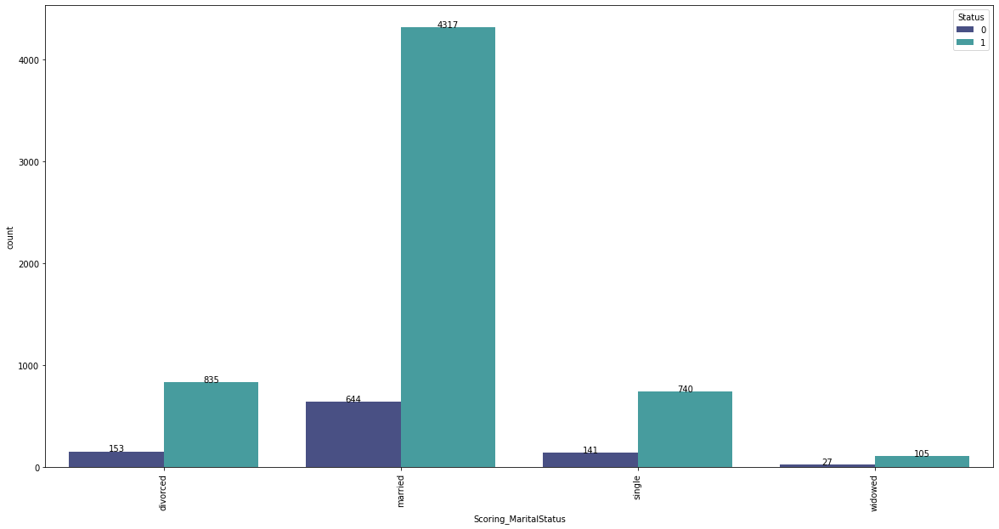

In [60]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_MaritalStatus', data=loan_data_map_filter, palette="mako", hue = 'Status')
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

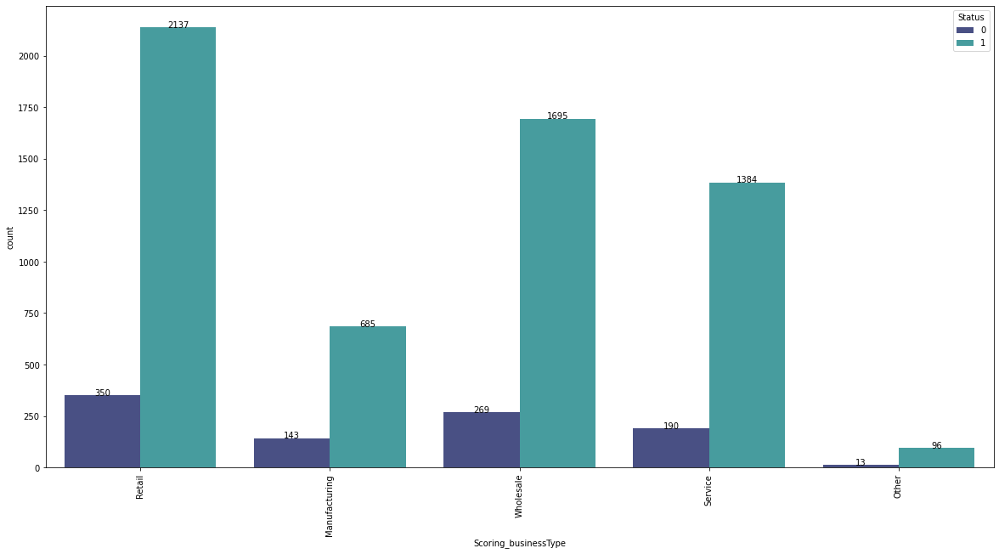

In [61]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_businessType', data=loan_data_map_filter, palette="mako", hue = 'Status')
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

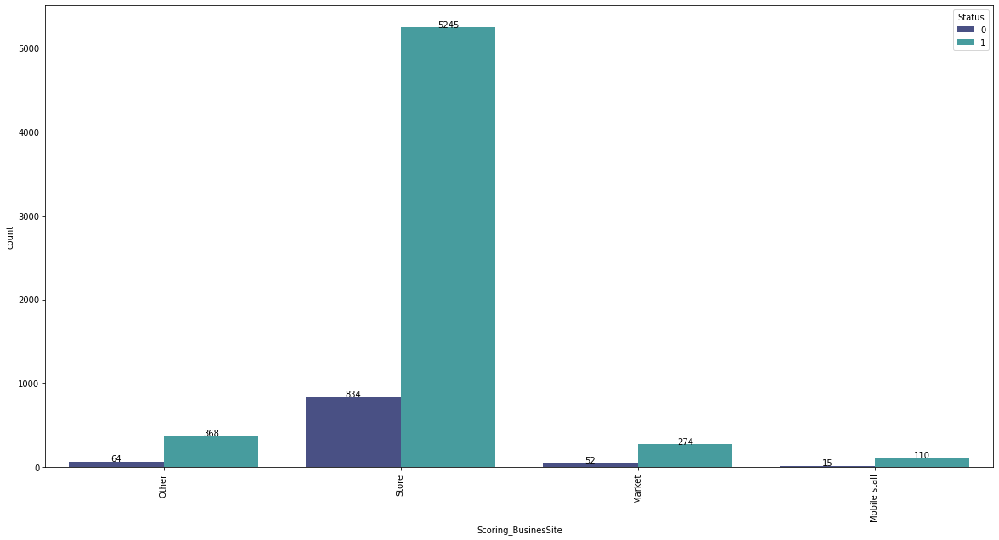

In [62]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_BusinesSite', data=loan_data_map_filter, palette="mako", hue = 'Status')
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

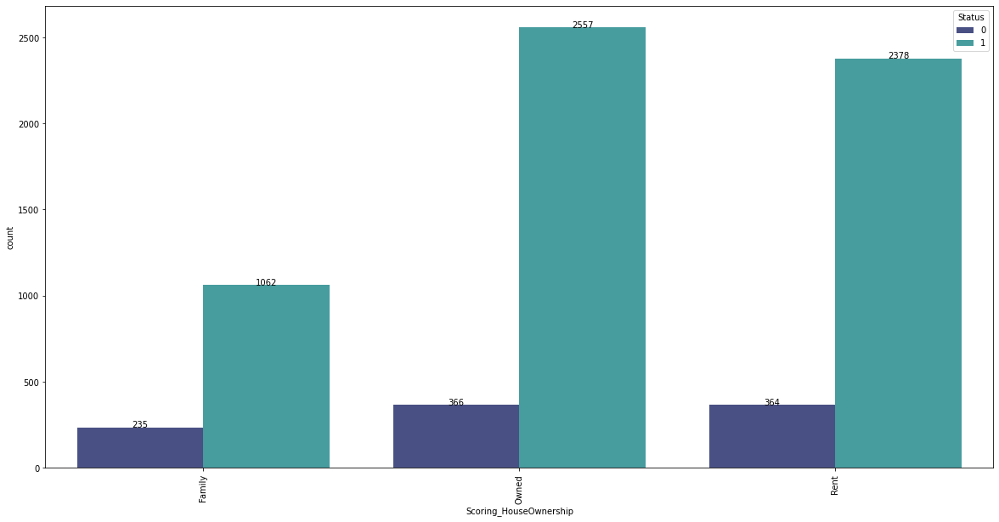

In [63]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1, x= 'Scoring_HouseOwnership', data=loan_data_map_filter, palette="mako", hue = 'Status')
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

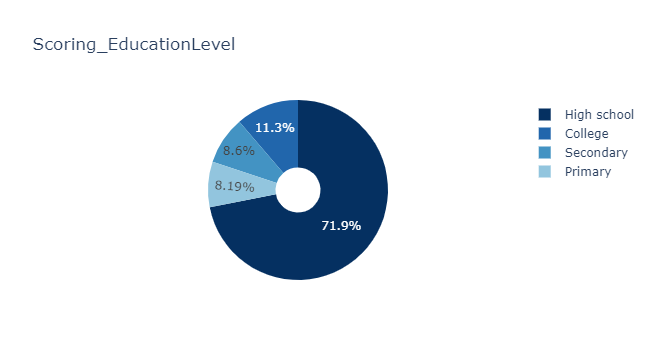

In [64]:
px.pie(loan_data_map_filter[loan_data_map_filter['Status']==0], names='Scoring_EducationLevel', title='Scoring_EducationLevel', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

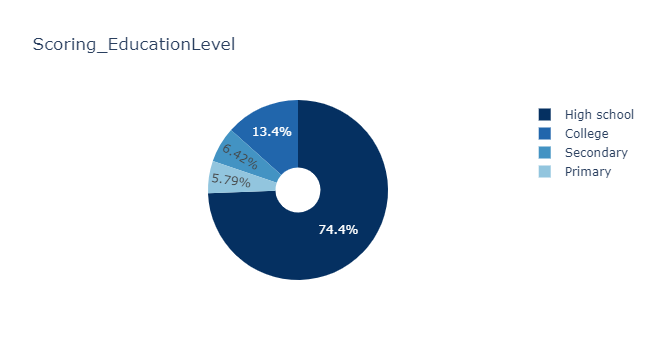

In [65]:
px.pie(loan_data_map_filter[loan_data_map_filter['Status']==1], names='Scoring_EducationLevel', title='Scoring_EducationLevel', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

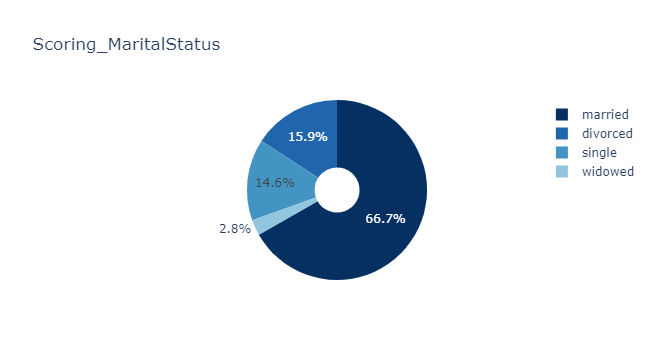

In [66]:
px.pie(loan_data_map_filter[loan_data_map_filter['Status']==0], names='Scoring_MaritalStatus', title='Scoring_MaritalStatus', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

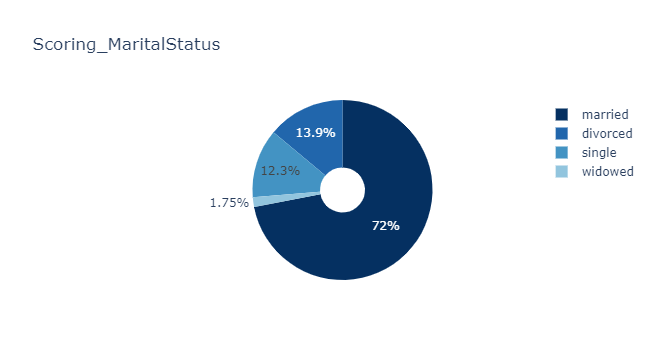

In [67]:
px.pie(loan_data_map_filter[loan_data_map_filter['Status']==1], names='Scoring_MaritalStatus', title='Scoring_MaritalStatus', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

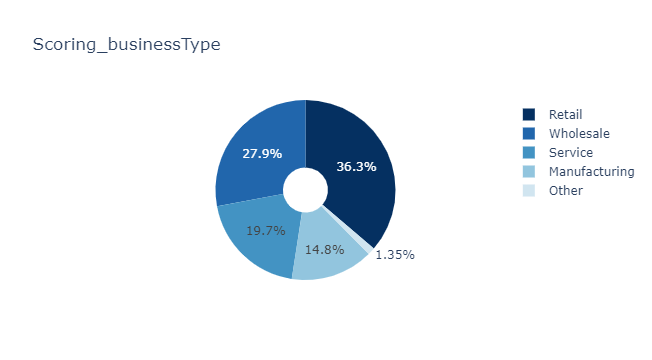

In [68]:
px.pie(loan_data_map_filter[loan_data_map_filter['Status']==0], names='Scoring_businessType', title='Scoring_businessType', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

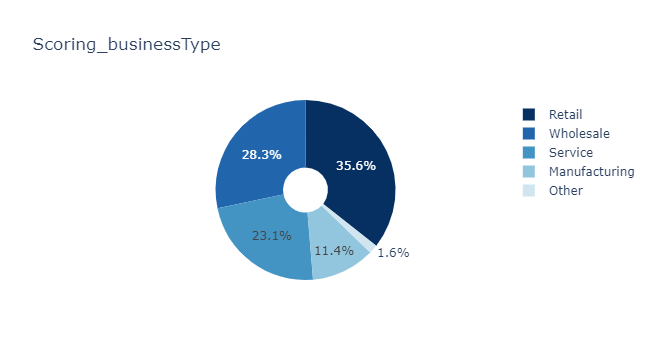

In [69]:
px.pie(loan_data_map_filter[loan_data_map_filter['Status']==1], names='Scoring_businessType', title='Scoring_businessType', hole=0.25, color_discrete_sequence= px.colors.sequential.RdBu_r)

### Step 3: Check the statistics for each of the variable by using df.describe().T.round(2)

In [70]:
# Note that this kind of visualization only works with continuous data
loan_data_map_filter.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
contractId,6962.0,205526.88,13205.32,176399.0,194439.0,206175.0,216466.5,229473.0
education,6962.0,7.09,0.98,1.0,7.0,7.0,7.0,11.0
Age,6962.0,41.44,8.75,24.0,35.0,41.0,48.0,60.0
businessType,6962.0,3.67,1.13,1.0,3.0,4.0,4.0,6.0
numberOfDependents,6962.0,1.93,0.95,1.0,1.0,2.0,3.0,5.0
numberOfStaff,6962.0,2.89,2.74,1.0,1.0,2.0,3.0,17.0
businessSite,6962.0,4.84,0.82,1.0,5.0,5.0,5.0,6.0
maritalStatus,6962.0,2.45,0.81,1.0,2.0,2.0,3.0,5.0
houseOwnership,6962.0,2.33,1.82,1.0,1.0,2.0,2.0,6.0
DPD,6962.0,19.65,53.58,-28.0,0.0,0.0,0.0,290.0


### Step 4: check the correlation of each variable with each other using 2 methods:
* Pairplot
* Pairplot with loan status as hue
* correlation function then visualize with heatmap

Note: this kind of visualization should only be applied to continuous variables. In this case we have the following variables:
* Age
* NumberOfDependents
* numberOfStaff

In [71]:
# Lưu ý muốn lấy một list column ra thì phải put in a list as arguments to the filter:
# loan_data_map = loan_data[[x1,x2]]
# Ở chiều drop table thì sẽ như sau: df1 = df1.drop(['B', 'C'], axis=1)
loan_data_map_filter_continuous = loan_data_map_filter[['Age', 'numberOfDependents', 'numberOfStaff','Status']]
loan_data_map_filter_continuous.head()

,Age,numberOfDependents,numberOfStaff,Status
6,40,3,8,1
7,40,3,8,1
12,38,1,4,1
13,38,1,4,1
14,42,3,2,0


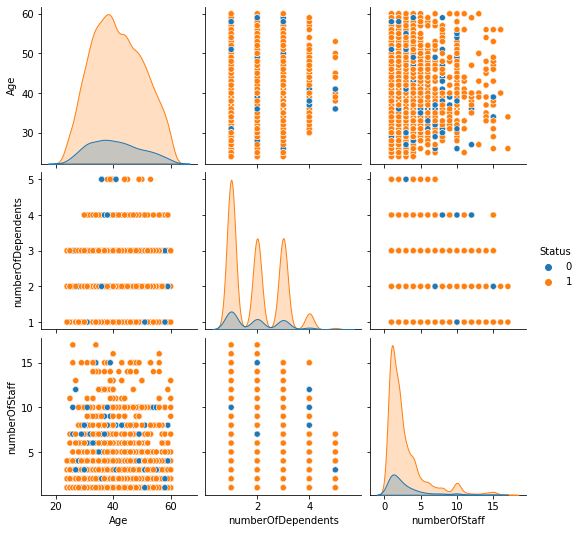

In [72]:
sns.pairplot(loan_data_map_filter_continuous,hue='Status')

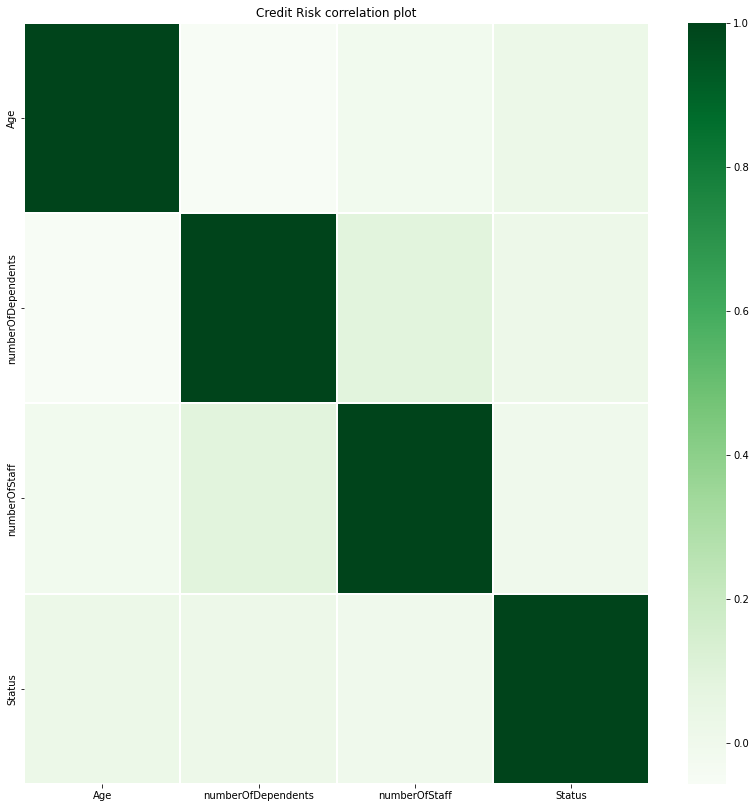

In [73]:
plt.figure(figsize = (14,14))
plt.title('Credit Risk correlation plot')
corr = loan_data_map_filter_continuous.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,cmap="Greens")
plt.show()

From this visualization we can conclude that these variables have no correlation

### Step 5: create cross-tab table to see if a variable have power in determining good or bad

In [74]:
loan_data_map_filter.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType,CRM_BusinesSite,Scoring_BusinesSite,CRM_EducationLevel,Scoring_EducationLevel,CRM_HouseOwnership,Scoring_HouseOwnership
6,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other,Phổ thông,High school,Nhà của gia đình,Family
7,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other,Cấp 3,High school,Nhà của gia đình,Family
12,178446,9,38,2,1,4,5,2,1,AN2,8/4/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Gia công,Manufacturing,Trong nhà (1 MB),Store,Trên phổ thông,College,Sở hữu,Owned
13,178446,9,38,2,1,4,5,2,1,AN2,8/4/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Gia công,Manufacturing,Trong nhà (1 MB),Store,Cao đẳng,College,Sở hữu,Owned
14,178743,7,42,1,3,2,5,2,1,AN1,8/6/2020 0:00,215,0,1,Có gia đình,married,NaN,NaN,Sản xuất,Manufacturing,Trong nhà (1 MB),Store,Phổ thông,High school,Sở hữu,Owned


In [75]:
cross_df_Scoring_MaritalStatus = pd.crosstab(index = loan_data_map_filter['Scoring_MaritalStatus'], columns = loan_data_map_filter['Status'], 
            margins = True, margins_name= "Total", normalize = 'index').round(4) * 100
cross_df_Scoring_MaritalStatus

Status,0,1
Scoring_MaritalStatus,,
divorced,15.49,84.51
married,12.98,87.02
single,16.00,84.00
widowed,20.45,79.55
Total,13.86,86.14


In [76]:
cross_df_Scoring_businessType = pd.crosstab(index = loan_data_map_filter['Scoring_businessType'], columns = loan_data_map_filter['Status'], 
            margins = True, margins_name= "Total", normalize = 'index').round(4) * 100
cross_df_Scoring_businessType

Status,0,1
Scoring_businessType,,
Manufacturing,17.27,82.73
Other,11.93,88.07
Retail,14.07,85.93
Service,12.07,87.93
Wholesale,13.70,86.30
Total,13.86,86.14


In [77]:
cross_df_Scoring_BusinesSite = pd.crosstab(index = loan_data_map_filter['Scoring_BusinesSite'], columns = loan_data_map_filter['Status'], 
            margins = True, margins_name= "Total", normalize = 'index').round(4) * 100
cross_df_Scoring_BusinesSite

Status,0,1
Scoring_BusinesSite,,
Market,15.95,84.05
Mobile stall,12.00,88.00
Other,14.81,85.19
Store,13.72,86.28
Total,13.86,86.14


In [78]:
cross_df_Scoring_EducationLevel = pd.crosstab(index = loan_data_map_filter['Scoring_EducationLevel'], columns = loan_data_map_filter['Status'], 
            margins = True, margins_name= "Total", normalize = 'index').round(4) * 100
cross_df_Scoring_EducationLevel

Status,0,1
Scoring_EducationLevel,,
College,11.98,88.02
High school,13.45,86.55
Primary,18.54,81.46
Secondary,17.74,82.26
Total,13.86,86.14


In [79]:
cross_df_Scoring_HouseOwnership = pd.crosstab(index = loan_data_map_filter['Scoring_HouseOwnership'], columns = loan_data_map_filter['Status'], 
            margins = True, margins_name= "Total", normalize = 'index').round(4) * 100
cross_df_Scoring_HouseOwnership

Status,0,1
Scoring_HouseOwnership,,
Family,18.12,81.88
Owned,12.52,87.48
Rent,13.27,86.73
Total,13.86,86.14


## V. Test WOE and Information Value for each variable 

Value - Predictive power
* Less than 0.02 - Useless
* 0.02 to 0.1 - Weak predictors
* 0.1 to 0.3 - Medium Predictors
* 0.3 to 0.5 - Strong predictors
* Over 0.5 - Suspicious

From the run data below, the variable with most predictive power and their corresponding information value are:

* House Ownership - 0.027
* Education - 0.02
* Marital Status - 0.015
* Business Type - 0.015


In [80]:
loan_data_map_filter.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType,CRM_BusinesSite,Scoring_BusinesSite,CRM_EducationLevel,Scoring_EducationLevel,CRM_HouseOwnership,Scoring_HouseOwnership
6,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other,Phổ thông,High school,Nhà của gia đình,Family
7,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other,Cấp 3,High school,Nhà của gia đình,Family
12,178446,9,38,2,1,4,5,2,1,AN2,8/4/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Gia công,Manufacturing,Trong nhà (1 MB),Store,Trên phổ thông,College,Sở hữu,Owned
13,178446,9,38,2,1,4,5,2,1,AN2,8/4/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Gia công,Manufacturing,Trong nhà (1 MB),Store,Cao đẳng,College,Sở hữu,Owned
14,178743,7,42,1,3,2,5,2,1,AN1,8/6/2020 0:00,215,0,1,Có gia đình,married,NaN,NaN,Sản xuất,Manufacturing,Trong nhà (1 MB),Store,Phổ thông,High school,Sở hữu,Owned


### Age test

In [81]:
loan_data = loan_data_map_filter[['contractId', 'Age', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad']  

In [82]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [83]:
def woe_ordered_continuous(df, discrete_variabe_name, good_bad_variable_df):
    df = pd.concat([df[discrete_variabe_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    df = df.sort_values(['WoE'])
    #df = df.sort_values(['WoE'])
    #df = df.reset_index(drop = True)
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df
# Here we define a function similar to the one above, ...
# ... with one slight difference: we order the results by the values of a different column.
# The function takes 3 arguments: a dataframe, a string, and a dataframe. The function returns a dataframe as a result.

In [84]:
def plot_by_woe(df_WoE, rotation_of_x_axis_labels = 0):
    x = np.array(df_WoE.iloc[:, 0].apply(str))    
    #matplotlib does not fare well with dataframes and strings
    #however, matplotlib does very well with np array as they are optimized to work with numpy
    y = df_WoE['WoE']
    plt.figure(figsize = (18, 6))
    plt.plot(x, y, marker = 'o', linestyle = '--', color = 'k')
    plt.xlabel(df_WoE.columns[0])
    plt.ylabel('Weight of Evidence')
    plt.title(str('Weight of Evidence by ' + df_WoE.columns[0]))
    plt.xticks(rotation = rotation_of_x_axis_labels)    

In [85]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'Age', df_targets_prepr)
df_temp

,Age,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
3,27,94,0.734043,0.013502,69.0,25.0,0.011506,0.025907,-0.811656,NaN,NaN,0.088865
6,30,176,0.772727,0.025280,136.0,40.0,0.022678,0.041451,-0.603111,0.038685,0.208545,0.088865
2,26,61,0.786885,0.008762,48.0,13.0,0.008004,0.013472,-0.520635,0.014158,0.082476,0.088865
31,55,115,0.808696,0.016518,93.0,22.0,0.015508,0.022798,-0.385329,0.021810,0.135305,0.088865
12,36,262,0.812977,0.037633,213.0,49.0,0.035518,0.050777,-0.357415,0.004281,0.027915,0.088865
17,41,216,0.819444,0.031026,177.0,39.0,0.029515,0.040415,-0.314298,0.006467,0.043116,0.088865
7,31,210,0.823810,0.030164,173.0,37.0,0.028848,0.038342,-0.284513,0.004365,0.029786,0.088865
22,46,228,0.824561,0.032749,188.0,40.0,0.031349,0.041451,-0.279324,0.000752,0.005189,0.088865
35,59,81,0.827160,0.011635,67.0,14.0,0.011172,0.014508,-0.261251,0.002599,0.018073,0.088865
8,32,243,0.831276,0.034904,202.0,41.0,0.033684,0.042487,-0.232191,0.004115,0.029060,0.088865


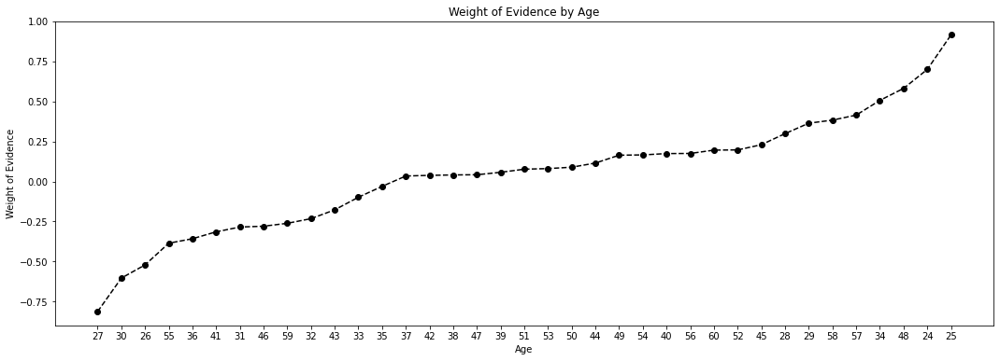

In [86]:
plot_by_woe(df_temp, 0)

In [87]:
df_inputs_prepr['Age_factor'] = pd.cut(df_inputs_prepr['Age'], 15)

In [88]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'Age_factor', df_targets_prepr)
df_temp

,Age_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
2,"(28.8, 31.2]",545,0.829358,0.078282,452.0,93.0,0.075371,0.096373,-0.245804,NaN,NaN,0.020787
1,"(26.4, 28.8]",244,0.831967,0.035047,203.0,41.0,0.033850,0.042487,-0.227253,0.002609,0.018551,0.020787
3,"(31.2, 33.6]",495,0.840404,0.071100,416.0,79.0,0.069368,0.081865,-0.165649,0.008437,0.061603,0.020787
7,"(40.8, 43.2]",704,0.842330,0.101120,593.0,111.0,0.098883,0.115026,-0.151222,0.001926,0.014427,0.020787
12,"(52.8, 55.2]",406,0.857143,0.058317,348.0,58.0,0.058029,0.060104,-0.035127,0.014813,0.116095,0.020787
4,"(33.6, 36.0]",789,0.860583,0.113330,679.0,110.0,0.113223,0.113990,-0.006746,0.003440,0.028381,0.020787
5,"(36.0, 38.4]",581,0.865749,0.083453,503.0,78.0,0.083875,0.080829,0.036995,0.005166,0.043741,0.020787
9,"(45.6, 48.0]",645,0.869767,0.092646,561.0,84.0,0.093547,0.087047,0.072018,0.004019,0.035023,0.020787
14,"(57.6, 60.0]",249,0.871486,0.035766,217.0,32.0,0.036185,0.033161,0.087275,0.001719,0.015257,0.020787
6,"(38.4, 40.8]",607,0.874794,0.087188,531.0,76.0,0.088544,0.078756,0.117142,0.003308,0.029867,0.020787


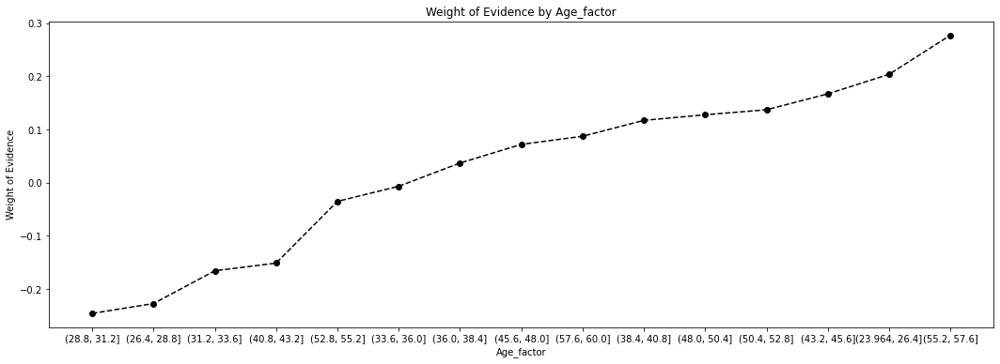

In [89]:
plot_by_woe(df_temp, 0)

In [90]:
## Create an age_factor_paretix column based on Paretix modelling example

conditions = [
    (df_inputs_prepr['Age'] < 38),
    (df_inputs_prepr['Age'] >= 38) & (df_inputs_prepr['Age'] <= 43),
    (df_inputs_prepr['Age'] >= 44) & (df_inputs_prepr['Age'] <= 50),
    (df_inputs_prepr['Age'] > 50)
    ]

values = ['< 38','38 – 43','44 – 50','50 +']

df_inputs_prepr['Age_factor_paretix'] = np.select(conditions, values)

In [91]:
df_temp = woe_ordered_continuous(df_inputs_prepr, 'Age_factor_paretix', df_targets_prepr)
df_temp

,Age_factor_paretix,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
3,< 38,2566,0.849571,0.368572,2180.0,386.0,0.363515,0.400000,-0.095644,NaN,NaN,0.008026
0,38 – 43,1580,0.858861,0.226946,1357.0,223.0,0.226280,0.231088,-0.021027,0.009289,0.074617,0.008026
2,50 +,1267,0.872139,0.181988,1105.0,162.0,0.184259,0.167876,0.093118,0.013278,0.114144,0.008026
1,44 – 50,1549,0.874758,0.222494,1355.0,194.0,0.225946,0.201036,0.116812,0.002619,0.023694,0.008026


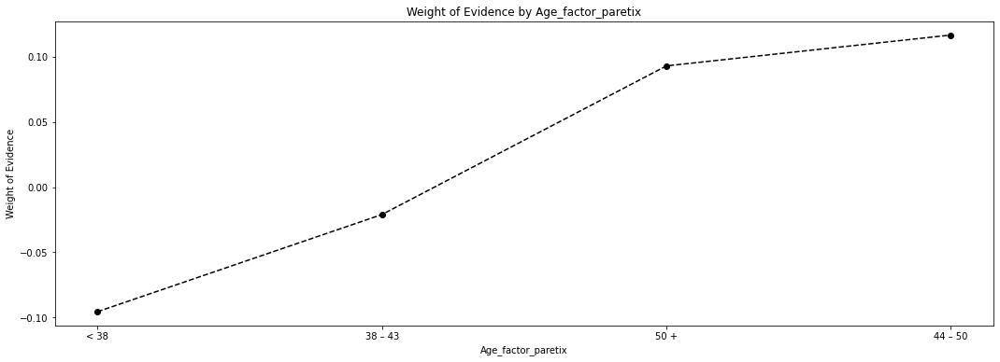

In [92]:
plot_by_woe(df_temp, 0)

In [93]:
# after we need to create a list of dummy variables using the results we have after assessing the WOE and IV, we do this using np where syntax:
loan_data_map_filter['Age:< 38'] = np.where((loan_data_map_filter['Age'] <= 37), 1, 0)
loan_data_map_filter['Age: 38-43'] = np.where((loan_data_map_filter['Age'] > 37) & (loan_data_map_filter['Age'] <= 43), 1, 0)
loan_data_map_filter['Age: 44-50'] = np.where((loan_data_map_filter['Age'] > 43) & (loan_data_map_filter['Age'] <= 50), 1, 0)
loan_data_map_filter['Age:> 50'] = np.where((loan_data_map_filter['Age'] >= 50), 1, 0)

### numberOfDependents test

In [94]:
loan_data_map_filter['numberOfDependents: 0'] = np.where((loan_data_map_filter['numberOfDependents'] == 0), 1, 0)
loan_data_map_filter['numberOfDependents: 1'] = np.where((loan_data_map_filter['numberOfDependents'] == 1), 1, 0)
loan_data_map_filter['numberOfDependents: 2'] = np.where((loan_data_map_filter['numberOfDependents'] >= 2), 1, 0)

In [95]:
conditions = [
    (loan_data_map_filter['numberOfDependents'] == 0),
    (loan_data_map_filter['numberOfDependents'] == 1),
    (loan_data_map_filter['numberOfDependents'] >= 2)
    ]

values = ['0','1','2']

loan_data_map_filter['numberOfDependents_factor'] = np.select(conditions, values)

In [96]:
loan_data = loan_data_map_filter[['contractId', 'numberOfDependents_factor', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [97]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [98]:
def woe_discrete(df, discrete_variabe_name, good_bad_variable_df):
    df = pd.concat([df[discrete_variabe_name], good_bad_variable_df], axis = 1)
    df = pd.concat([df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].count(),
                    df.groupby(df.columns.values[0], as_index = False)[df.columns.values[1]].mean()], axis = 1)
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [df.columns.values[0], 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    df = df.sort_values(['WoE'])
    df = df.reset_index(drop = True)
    df['diff_prop_good'] = df['prop_good'].diff().abs()
    df['diff_WoE'] = df['WoE'].diff().abs()
    df['IV'] = (df['prop_n_good'] - df['prop_n_bad']) * df['WoE']
    df['IV'] = df['IV'].sum()
    return df

In [99]:
def plot_by_woe(df_WoE, rotation_of_x_axis_labels = 0):
    x = np.array(df_WoE.iloc[:, 0].apply(str))
    # Turns the values of the column with index 0 to strings, makes an array from these strings, and passes it to variable x.
    y = df_WoE['WoE']
    # Selects a column with label 'WoE' and passes it to variable y.
    plt.figure(figsize=(18, 6))
    # Sets the graph size to width 18 x height 6.
    plt.plot(x, y, marker = 'o', linestyle = '--', color = 'k')
    # Plots the datapoints with coordiantes variable x on the x-axis and variable y on the y-axis.
    # Sets the marker for each datapoint to a circle, the style line between the points to dashed, and the color to black.
    plt.xlabel(df_WoE.columns[0])
    # Names the x-axis with the name of the column with index 0.
    plt.ylabel('Weight of Evidence')
    # Names the y-axis 'Weight of Evidence'.
    plt.title(str('Weight of Evidence by ' + df_WoE.columns[0]))
    # Names the grapth 'Weight of Evidence by ' the name of the column with index 0.
    plt.xticks(rotation = rotation_of_x_axis_labels)
    # Rotates the labels of the x-axis a predefined number of degrees.

In [100]:
df_temp = woe_discrete(df_inputs_prepr, 'numberOfDependents_factor', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,numberOfDependents_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,1,3009,0.853772,0.432203,2569.0,440.0,0.428381,0.455959,-0.062389,NaN,NaN,0.003084
1,2,3953,0.867189,0.567797,3428.0,525.0,0.571619,0.544041,0.049447,0.013417,0.111837,0.003084


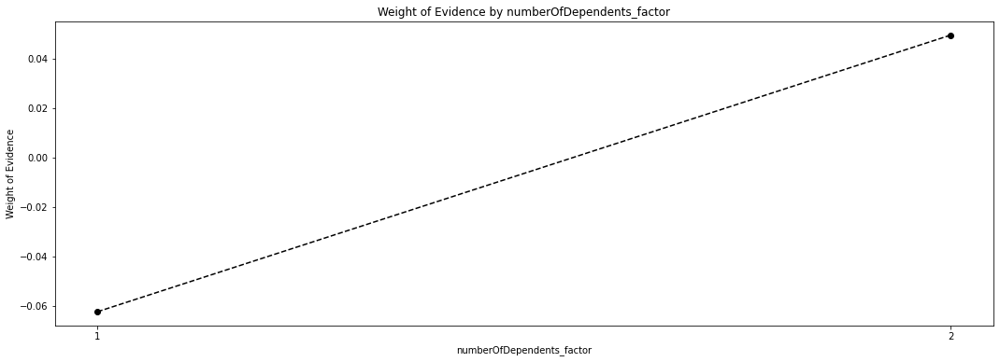

In [101]:
plot_by_woe(df_temp)

### numberOfStaff test

In [102]:
loan_data_map_filter['numberOfStaff: 0'] = np.where((loan_data_map_filter['numberOfStaff'] == 0), 1, 0)
loan_data_map_filter['numberOfStaff: 1-2'] = np.where((loan_data_map_filter['numberOfStaff'] >= 1) & (loan_data_map_filter['numberOfStaff'] <= 2), 1, 0)
loan_data_map_filter['numberOfStaff: 3-5'] = np.where((loan_data_map_filter['numberOfStaff'] >= 3) & (loan_data_map_filter['numberOfStaff'] <= 5), 1, 0)
loan_data_map_filter['numberOfStaff: 6+'] = np.where((loan_data_map_filter['numberOfStaff'] >= 6), 1, 0)

In [103]:
## Create an age_factor_paretix column based on Paretix modelling example

conditions = [
    (loan_data_map_filter['numberOfStaff'] == 0),
    (loan_data_map_filter['numberOfStaff'] >= 1) & (loan_data_map_filter['numberOfStaff'] <= 2),
    (loan_data_map_filter['numberOfStaff'] >= 3) & (loan_data_map_filter['numberOfStaff'] <= 5),
    (loan_data_map_filter['numberOfStaff'] >= 6)
    ]

values = ['0','1-2','3-5','6+']

loan_data_map_filter['numberOfStaff_factor'] = np.select(conditions, values)

In [104]:
loan_data = loan_data_map_filter[['contractId', 'numberOfStaff_factor', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [105]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [106]:
df_temp = woe_discrete(df_inputs_prepr, 'numberOfStaff_factor', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,numberOfStaff_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,3-5,1629,0.852670,0.233984,1389.0,240.0,0.231616,0.248705,-0.071186,NaN,NaN,0.00168
1,1-2,4455,0.863524,0.639902,3847.0,608.0,0.641487,0.630052,0.017987,0.010854,0.089174,0.00168
2,6+,878,0.866743,0.126113,761.0,117.0,0.126897,0.121244,0.045573,0.003218,0.027585,0.00168


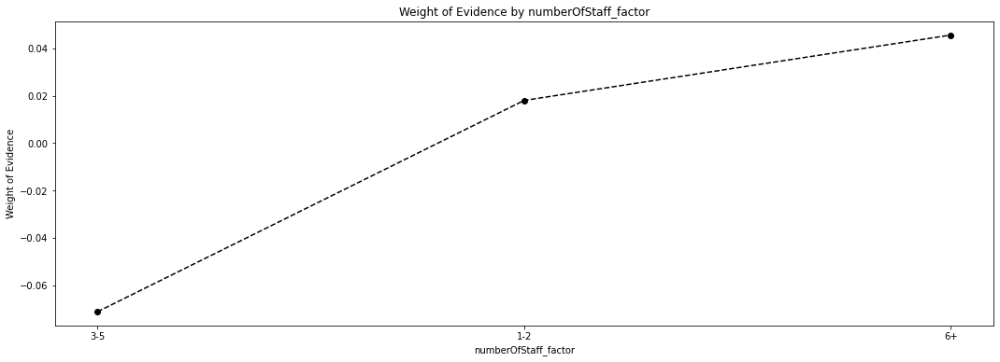

In [107]:
plot_by_woe(df_temp)

### education test

In [108]:
loan_data_map_filter.columns

Index(['contractId', 'education', 'Age', 'businessType', 'numberOfDependents',
       'numberOfStaff', 'businessSite', 'maritalStatus', 'houseOwnership',
       'businessCode', 'Ngaymo', 'DPD', 'Status', 'RN', 'CRM_MaritalStatus',
       'Scoring_MaritalStatus', 'CRM_BusinessCode', 'Scoring_BusinessCode',
       'CRM_businessType', 'Scoring_businessType', 'CRM_BusinesSite',
       'Scoring_BusinesSite', 'CRM_EducationLevel', 'Scoring_EducationLevel',
       'CRM_HouseOwnership', 'Scoring_HouseOwnership', 'Age:< 38',
       'Age: 38-43', 'Age: 44-50', 'Age:> 50', 'numberOfDependents: 0',
       'numberOfDependents: 1', 'numberOfDependents: 2',
       'numberOfDependents_factor', 'numberOfStaff: 0', 'numberOfStaff: 1-2',
       'numberOfStaff: 3-5', 'numberOfStaff: 6+', 'numberOfStaff_factor'],
      dtype='object')

In [109]:
loan_data_map_filter['Scoring_EducationLevel'].unique()

array(['High school', 'College', 'Secondary', 'Primary'], dtype=object)

In [110]:
# for education variables since all of the variables are already correctly classified into each group,
# we can use get dummy to create the desired variable and no need to create any education data column for testing

In [111]:
loan_data_map_filter = pd.concat([loan_data_map_filter, pd.get_dummies(loan_data_map_filter['Scoring_EducationLevel'], prefix = 'Scoring_EducationLevel', prefix_sep = ':')], axis = 1)

In [112]:
loan_data = loan_data_map_filter[['contractId', 'Scoring_EducationLevel', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [113]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [114]:
df_temp = woe_discrete(df_inputs_prepr, 'Scoring_EducationLevel', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,Scoring_EducationLevel,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,Primary,426,0.814554,0.061189,347.0,79.0,0.057862,0.081865,-0.347010,NaN,NaN,0.019032
1,Secondary,468,0.822650,0.067222,385.0,83.0,0.064199,0.086010,-0.292484,0.008096,0.054526,0.019032
2,High school,5158,0.865452,0.740879,4464.0,694.0,0.744372,0.719171,0.034442,0.042802,0.326926,0.019032
3,College,910,0.880220,0.130710,801.0,109.0,0.133567,0.112953,0.167627,0.014768,0.133185,0.019032


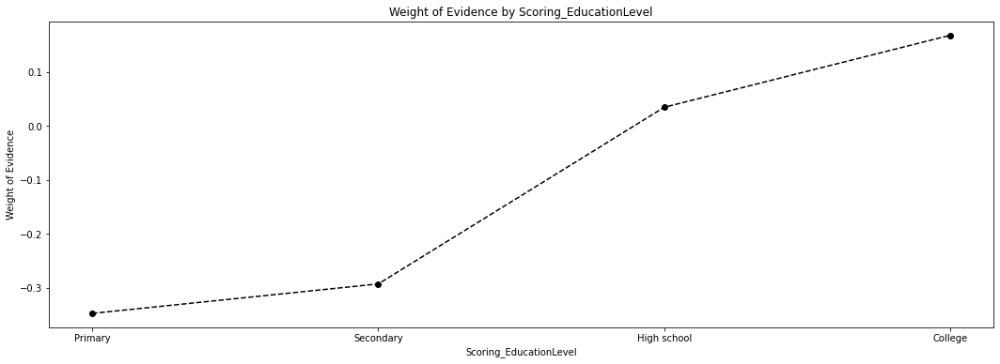

In [115]:
plot_by_woe(df_temp)

### businessType test

In [116]:
loan_data_map_filter['Scoring_businessType'].unique()

array(['Retail', 'Manufacturing', 'Wholesale', 'Service', 'Other'],
      dtype=object)

In [117]:
loan_data_map_filter = pd.concat([loan_data_map_filter, pd.get_dummies(loan_data_map_filter['Scoring_businessType'], prefix = 'Scoring_businessType', prefix_sep = ':')], axis = 1)

In [118]:
loan_data = loan_data_map_filter[['contractId', 'Scoring_businessType', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [119]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [120]:
df_temp = woe_discrete(df_inputs_prepr, 'Scoring_businessType', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,Scoring_businessType,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,Manufacturing,828,0.827295,0.118931,685.0,143.0,0.114224,0.148187,-0.260312,NaN,NaN,0.014827
1,Retail,2487,0.859268,0.357225,2137.0,350.0,0.356345,0.362694,-0.017661,0.031974,0.242651,0.014827
2,Wholesale,1964,0.863035,0.282103,1695.0,269.0,0.282641,0.278756,0.013840,0.003766,0.031502,0.014827
3,Service,1574,0.879288,0.226084,1384.0,190.0,0.230782,0.196891,0.158823,0.016254,0.144982,0.014827
4,Other,109,0.880734,0.015656,96.0,13.0,0.016008,0.013472,0.172512,0.001446,0.013690,0.014827


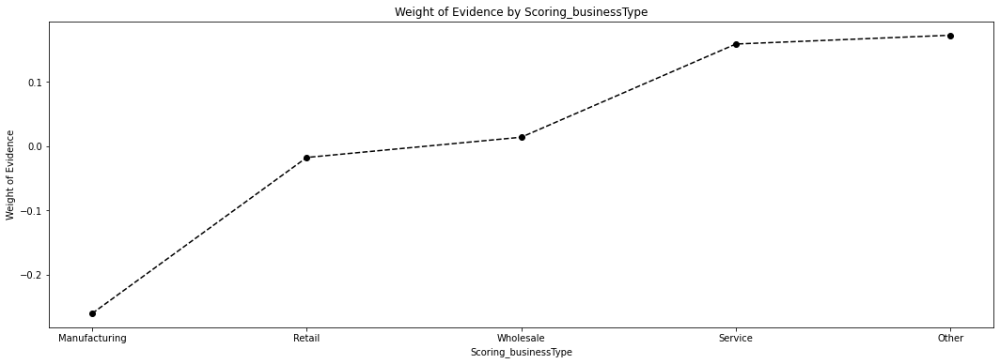

In [121]:
plot_by_woe(df_temp)

### businessSite test

In [122]:
loan_data_map_filter['Scoring_BusinesSite'].unique()

array(['Other', 'Store', 'Market', 'Mobile stall'], dtype=object)

In [123]:
loan_data_map_filter = pd.concat([loan_data_map_filter, pd.get_dummies(loan_data_map_filter['Scoring_BusinesSite'], prefix = 'Scoring_BusinesSite', prefix_sep = ':')], axis = 1)

In [124]:
loan_data = loan_data_map_filter[['contractId', 'Scoring_BusinesSite', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [125]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [126]:
df_temp = woe_discrete(df_inputs_prepr, 'Scoring_BusinesSite', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,Scoring_BusinesSite,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,Market,326,0.840491,0.046826,274.0,52.0,0.045690,0.053886,-0.165002,NaN,NaN,0.002324
1,Other,432,0.851852,0.062051,368.0,64.0,0.061364,0.066321,-0.077687,0.011361,0.087315,0.002324
2,Store,6079,0.862806,0.873169,5245.0,834.0,0.874604,0.864249,0.011911,0.010955,0.089597,0.002324
3,Mobile stall,125,0.880000,0.017955,110.0,15.0,0.018343,0.015544,0.165544,0.017194,0.153633,0.002324


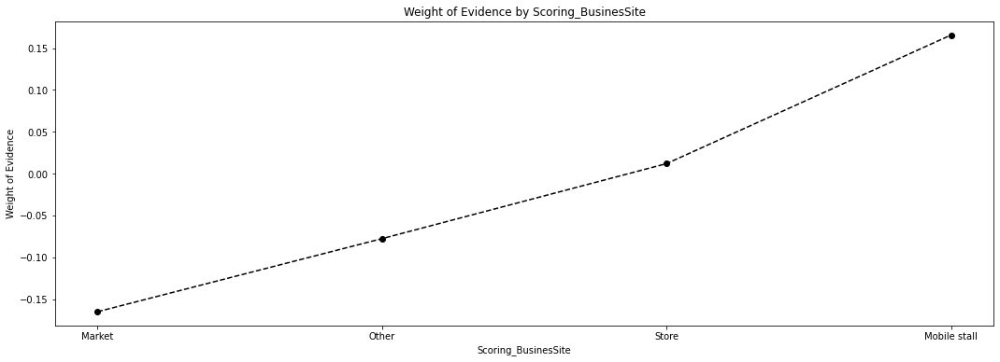

In [127]:
plot_by_woe(df_temp)

### maritalStatus test

In [128]:
loan_data_map_filter['Scoring_MaritalStatus'].unique()

array(['divorced', 'married', 'single', 'widowed'], dtype=object)

In [129]:
loan_data_map_filter = pd.concat([loan_data_map_filter, pd.get_dummies(loan_data_map_filter['Scoring_MaritalStatus'], prefix = 'Scoring_MaritalStatus', prefix_sep = ':')], axis = 1)

In [130]:
loan_data = loan_data_map_filter[['contractId', 'Scoring_MaritalStatus', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [131]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [132]:
df_temp = woe_discrete(df_inputs_prepr, 'Scoring_MaritalStatus', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,Scoring_MaritalStatus,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,widowed,132,0.795455,0.018960,105.0,27.0,0.017509,0.027979,-0.468763,NaN,NaN,0.015232
1,single,881,0.839955,0.126544,740.0,141.0,0.123395,0.146114,-0.168996,0.044500,0.299767,0.015232
2,divorced,988,0.845142,0.141913,835.0,153.0,0.139236,0.158549,-0.129893,0.005187,0.039104,0.015232
3,married,4961,0.870187,0.712583,4317.0,644.0,0.719860,0.667358,0.075731,0.025046,0.205623,0.015232


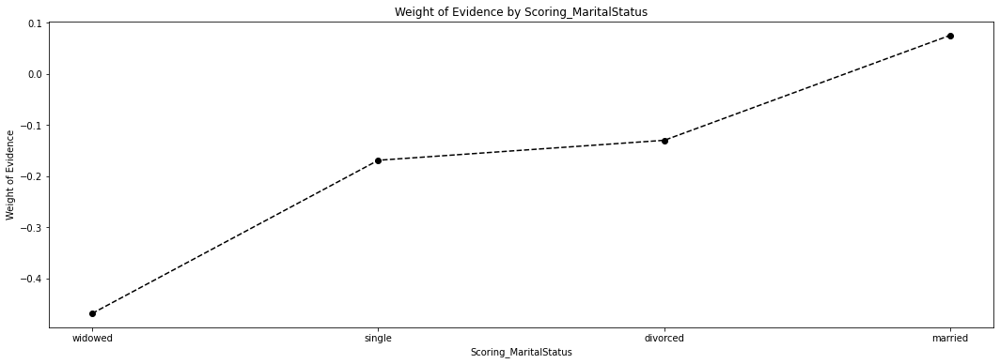

In [133]:
plot_by_woe(df_temp)

### houseOwnership test

In [134]:
loan_data_map_filter['Scoring_HouseOwnership'].unique()

array(['Family', 'Owned', 'Rent'], dtype=object)

In [135]:
loan_data_map_filter = pd.concat([loan_data_map_filter, pd.get_dummies(loan_data_map_filter['Scoring_HouseOwnership'], prefix = 'Scoring_HouseOwnership', prefix_sep = ':')], axis = 1)

In [136]:
loan_data_map_filter.head()

,contractId,education,Age,businessType,numberOfDependents,numberOfStaff,businessSite,maritalStatus,houseOwnership,businessCode,Ngaymo,DPD,Status,RN,CRM_MaritalStatus,Scoring_MaritalStatus,CRM_BusinessCode,Scoring_BusinessCode,CRM_businessType,Scoring_businessType,CRM_BusinesSite,Scoring_BusinesSite,CRM_EducationLevel,Scoring_EducationLevel,CRM_HouseOwnership,Scoring_HouseOwnership,Age:< 38,Age: 38-43,Age: 44-50,Age:> 50,numberOfDependents: 0,numberOfDependents: 1,numberOfDependents: 2,numberOfDependents_factor,numberOfStaff: 0,numberOfStaff: 1-2,numberOfStaff: 3-5,numberOfStaff: 6+,numberOfStaff_factor,Scoring_EducationLevel:College,Scoring_EducationLevel:High school,Scoring_EducationLevel:Primary,Scoring_EducationLevel:Secondary,Scoring_businessType:Manufacturing,Scoring_businessType:Other,Scoring_businessType:Retail,Scoring_businessType:Service,Scoring_businessType:Wholesale,Scoring_BusinesSite:Market,Scoring_BusinesSite:Mobile stall,Scoring_BusinesSite:Other,Scoring_BusinesSite:Store,Scoring_MaritalStatus:divorced,Scoring_MaritalStatus:married,Scoring_MaritalStatus:single,Scoring_MaritalStatus:widowed,Scoring_HouseOwnership:Family,Scoring_HouseOwnership:Owned,Scoring_HouseOwnership:Rent
6,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other,Phổ thông,High school,Nhà của gia đình,Family,0,1,0,0,0,0,1,2,0,0,0,1,6+,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0
7,176399,7,40,4,3,8,6,4,6,AA6,8/12/2020 0:00,0,1,1,Đã Li dị,divorced,NaN,NaN,Bán lẻ,Retail,Khác,Other,Cấp 3,High school,Nhà của gia đình,Family,0,1,0,0,0,0,1,2,0,0,0,1,6+,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0
12,178446,9,38,2,1,4,5,2,1,AN2,8/4/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Gia công,Manufacturing,Trong nhà (1 MB),Store,Trên phổ thông,College,Sở hữu,Owned,0,1,0,0,0,1,0,1,0,0,1,0,3-5,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
13,178446,9,38,2,1,4,5,2,1,AN2,8/4/2020 0:00,0,1,1,Có gia đình,married,NaN,NaN,Gia công,Manufacturing,Trong nhà (1 MB),Store,Cao đẳng,College,Sở hữu,Owned,0,1,0,0,0,1,0,1,0,0,1,0,3-5,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0
14,178743,7,42,1,3,2,5,2,1,AN1,8/6/2020 0:00,215,0,1,Có gia đình,married,NaN,NaN,Sản xuất,Manufacturing,Trong nhà (1 MB),Store,Phổ thông,High school,Sở hữu,Owned,0,1,0,0,0,0,1,2,0,1,0,0,1-2,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0


In [137]:
loan_data = loan_data_map_filter[['contractId', 'Scoring_HouseOwnership', 'Status']]
loan_data.columns = [loan_data.columns.values[0], loan_data.columns.values[1], 'good_bad'] 

In [138]:
df_inputs_prepr = loan_data.drop('good_bad', axis = 1)
df_targets_prepr = loan_data['good_bad']

In [139]:
df_temp = woe_discrete(df_inputs_prepr, 'Scoring_HouseOwnership', df_targets_prepr)
# We execute the function we defined with the necessary arguments: a dataframe, a string, and a dataframe.
# We store the result in a dataframe.
df_temp

,Scoring_HouseOwnership,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,diff_prop_good,diff_WoE,IV
0,Family,1297,0.818813,0.186297,1062.0,235.0,0.177089,0.243523,-0.318563,NaN,NaN,0.027644
1,Rent,2742,0.867250,0.393852,2378.0,364.0,0.396532,0.377202,0.049975,0.048438,0.368538,0.027644
2,Owned,2923,0.874786,0.419851,2557.0,366.0,0.426380,0.379275,0.117070,0.007536,0.067095,0.027644


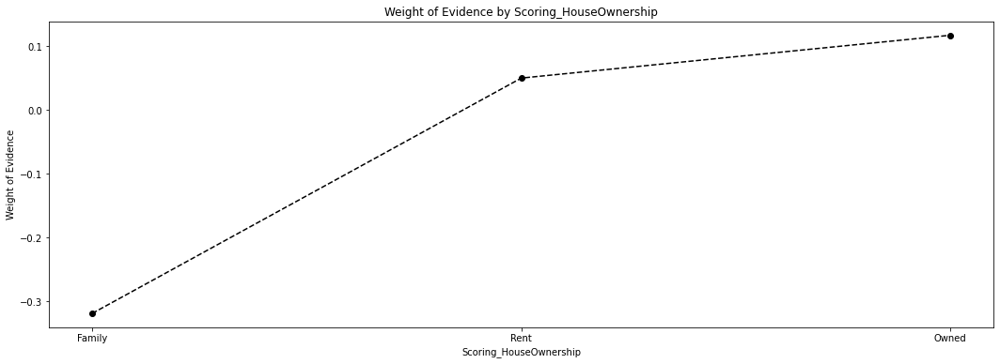

In [140]:
plot_by_woe(df_temp)

## VI. Modelling with Logistic Regression 

### Selecting the Features

In [141]:
# Check the final dataframe

loan_data_map_filter.columns

Index(['contractId', 'education', 'Age', 'businessType', 'numberOfDependents',
       'numberOfStaff', 'businessSite', 'maritalStatus', 'houseOwnership',
       'businessCode', 'Ngaymo', 'DPD', 'Status', 'RN', 'CRM_MaritalStatus',
       'Scoring_MaritalStatus', 'CRM_BusinessCode', 'Scoring_BusinessCode',
       'CRM_businessType', 'Scoring_businessType', 'CRM_BusinesSite',
       'Scoring_BusinesSite', 'CRM_EducationLevel', 'Scoring_EducationLevel',
       'CRM_HouseOwnership', 'Scoring_HouseOwnership', 'Age:< 38',
       'Age: 38-43', 'Age: 44-50', 'Age:> 50', 'numberOfDependents: 0',
       'numberOfDependents: 1', 'numberOfDependents: 2',
       'numberOfDependents_factor', 'numberOfStaff: 0', 'numberOfStaff: 1-2',
       'numberOfStaff: 3-5', 'numberOfStaff: 6+', 'numberOfStaff_factor',
       'Scoring_EducationLevel:College', 'Scoring_EducationLevel:High school',
       'Scoring_EducationLevel:Primary', 'Scoring_EducationLevel:Secondary',
       'Scoring_businessType:Manufacturin

In [142]:
# get the list of variables that go into the final dataframe following each of the test performed above:
loan_data_map_filter_to_model_with_ref = loan_data_map_filter.loc[: ,[ 
'Age:< 38',
'Age: 38-43',
'Age: 44-50',
'Age:> 50',
'numberOfDependents: 0',
'numberOfDependents: 1',
'numberOfDependents: 2',
'numberOfStaff: 0',
'numberOfStaff: 1-2',
'numberOfStaff: 3-5',
'numberOfStaff: 6+',
'Scoring_EducationLevel:College', 
'Scoring_EducationLevel:High school',
'Scoring_EducationLevel:Primary',
'Scoring_EducationLevel:Secondary',
'Scoring_businessType:Manufacturing',
'Scoring_businessType:Other',
'Scoring_businessType:Retail',
'Scoring_businessType:Service',
'Scoring_businessType:Wholesale',
'Scoring_BusinesSite:Market',
'Scoring_BusinesSite:Mobile stall',
'Scoring_BusinesSite:Other',
'Scoring_BusinesSite:Store',
'Scoring_MaritalStatus:divorced',
'Scoring_MaritalStatus:married',
'Scoring_MaritalStatus:single',
'Scoring_MaritalStatus:widowed',
'Scoring_HouseOwnership:Family',
'Scoring_HouseOwnership:Owned', 
'Scoring_HouseOwnership:Rent',
'Status'
]]

In [143]:
# To avoid colinearity in modelling, we need to get rid of all the constant variable and 1 of the category for each variable

ref_categories = [
'Age:< 38',
'numberOfDependents: 1',
'numberOfStaff: 3-5',
'Scoring_EducationLevel:Primary',
'Scoring_businessType:Manufacturing',
'Scoring_BusinesSite:Market',
'Scoring_MaritalStatus:widowed',
'Scoring_HouseOwnership:Family',
'numberOfDependents: 0',
'numberOfStaff: 0',
# from here on are the features that have p value over 0.5   
'numberOfStaff: 6+',    
'Scoring_EducationLevel:Secondary',
'Scoring_businessType:Other',
'Scoring_BusinesSite:Other',
]

In [144]:
loan_data_map_filter_to_model = loan_data_map_filter_to_model_with_ref.drop(ref_categories, axis = 1)

In [145]:
loan_data_map_filter_to_model.head()

,Age: 38-43,Age: 44-50,Age:> 50,numberOfDependents: 2,numberOfStaff: 1-2,Scoring_EducationLevel:College,Scoring_EducationLevel:High school,Scoring_businessType:Retail,Scoring_businessType:Service,Scoring_businessType:Wholesale,Scoring_BusinesSite:Mobile stall,Scoring_BusinesSite:Store,Scoring_MaritalStatus:divorced,Scoring_MaritalStatus:married,Scoring_MaritalStatus:single,Scoring_HouseOwnership:Owned,Scoring_HouseOwnership:Rent,Status
6,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1
7,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1
12,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,1
13,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,1
14,1,0,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0,0


In [146]:
loan_data_map_filter_to_model_input = loan_data_map_filter_to_model.drop('Status', axis=1)

In [147]:
loan_data_map_filter_to_model_input.head()

,Age: 38-43,Age: 44-50,Age:> 50,numberOfDependents: 2,numberOfStaff: 1-2,Scoring_EducationLevel:College,Scoring_EducationLevel:High school,Scoring_businessType:Retail,Scoring_businessType:Service,Scoring_businessType:Wholesale,Scoring_BusinesSite:Mobile stall,Scoring_BusinesSite:Store,Scoring_MaritalStatus:divorced,Scoring_MaritalStatus:married,Scoring_MaritalStatus:single,Scoring_HouseOwnership:Owned,Scoring_HouseOwnership:Rent
6,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0
7,1,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0
12,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0
13,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0
14,1,0,0,1,1,0,1,0,0,0,0,1,0,1,0,1,0


In [148]:
loan_data_map_filter_to_model_output = loan_data_map_filter_to_model['Status']

In [149]:
loan_data_map_filter_to_model_output.head()

6     1
7     1
12    1
13    1
14    0
Name: Status, dtype: int64

In [150]:
inputs_train, inputs_test, loan_data_targets_train, loan_data_targets_test = train_test_split(loan_data_map_filter_to_model_input, loan_data_map_filter_to_model_output, test_size = 0.2)

### Raw logistic regression model

In [151]:
reg = LogisticRegression()
# We create an instance of an object from the 'LogisticRegression' class.

In [152]:
pd.options.display.max_rows = None
# Sets the pandas dataframe options to display all columns/ ro

In [153]:
reg.fit(inputs_train, loan_data_targets_train)
# Estimates the coefficients of the object from the 'LogisticRegression' class
# with inputs (independent variables) contained in the first dataframe
# and targets (dependent variables) contained in the second dataframe.

LogisticRegression()

In [154]:
reg.intercept_
# Displays the intercept contain in the estimated ("fitted") object from the 'LogisticRegression' class.

array([0.47437639])

In [155]:
reg.coef_
# Displays the coefficients contained in the estimated ("fitted") object from the 'LogisticRegression' class.

array([[6.00195037e-05, 2.15515423e-01, 1.76708627e-01, 1.41862653e-01,
        3.12709332e-02, 6.01700524e-01, 3.80733785e-01, 2.09660321e-01,
        3.75407491e-01, 2.82200916e-01, 3.55311767e-01, 1.43068435e-02,
        1.96824999e-01, 4.37491211e-01, 3.08420042e-01, 2.67517446e-01,
        2.54397132e-01]])

In [156]:
feature_name = inputs_train.columns.values
# Stores the names of the columns of a dataframe in a variable.

In [157]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
# Creates a dataframe with a column titled 'Feature name' and row values contained in the 'feature_name' variable.
summary_table['Coefficients'] = np.transpose(reg.coef_)
# Creates a new column in the dataframe, called 'Coefficients',
# with row values the transposed coefficients from the 'LogisticRegression' object.
summary_table.index = summary_table.index + 1
# Increases the index of every row of the dataframe with 1.
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
# Assigns values of the row with index 0 of the dataframe.
summary_table = summary_table.sort_index()
# Sorts the dataframe by index.
summary_table

,Feature name,Coefficients
0,Intercept,0.474376
1,Age: 38-43,0.000060
2,Age: 44-50,0.215515
3,Age:> 50,0.176709
4,numberOfDependents: 2,0.141863
5,numberOfStaff: 1-2,0.031271
6,Scoring_EducationLevel:College,0.601701
7,Scoring_EducationLevel:High school,0.380734
8,Scoring_businessType:Retail,0.209660
9,Scoring_businessType:Service,0.375407


### Statsmodels logistic regression

In [158]:
import statsmodels.api as sm
logit_model=sm.Logit(loan_data_targets_train,inputs_train)
result=logit_model.fit()
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.393675
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:                 Status   No. Observations:                 5569
Model:                          Logit   Df Residuals:                     5552
Method:                           MLE   Df Model:                           16
Date:                Tue, 22 Nov 2022   Pseudo R-squ.:                 0.01211
Time:                        13:05:58   Log-Likelihood:                -2192.4
converged:                       True   LL-Null:                       -2219.3
Covariance Type:            nonrobust   LLR p-value:                 5.656e-06
                                         coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Age: 38-43                             0.0209      0.103    

In [159]:
# we need to check the correlation of the variable to ensure there is no colinearity or constant in the data

inputs_train.corr()

,Age: 38-43,Age: 44-50,Age:> 50,numberOfDependents: 2,numberOfStaff: 1-2,Scoring_EducationLevel:College,Scoring_EducationLevel:High school,Scoring_businessType:Retail,Scoring_businessType:Service,Scoring_businessType:Wholesale,Scoring_BusinesSite:Mobile stall,Scoring_BusinesSite:Store,Scoring_MaritalStatus:divorced,Scoring_MaritalStatus:married,Scoring_MaritalStatus:single,Scoring_HouseOwnership:Owned,Scoring_HouseOwnership:Rent
Age: 38-43,1.000000,-0.295100,-0.280638,0.164486,-0.046370,0.002963,0.007439,0.009641,-0.036201,-0.003136,-0.022501,-0.027158,0.033672,0.028849,-0.064666,-0.008394,0.016359
Age: 44-50,-0.295100,1.000000,-0.110500,0.091067,-0.002112,-0.045310,0.009135,-0.017960,-0.015591,0.003449,-0.033323,-0.010215,0.053567,0.041379,-0.123047,0.110639,-0.059747
Age:> 50,-0.280638,-0.110500,1.000000,-0.212522,0.031569,-0.113244,0.031678,0.057254,-0.069682,0.029951,0.076545,-0.042508,0.039540,0.022743,-0.118765,0.152203,-0.086894
numberOfDependents: 2,0.164486,0.091067,-0.212522,1.000000,-0.078876,0.028672,-0.026025,-0.007893,-0.008935,-0.040548,-0.052910,-0.002881,0.025597,0.271819,-0.395517,0.065155,-0.026739
numberOfStaff: 1-2,-0.046370,-0.002112,0.031569,-0.078876,1.000000,-0.052383,0.002845,0.126207,-0.001294,0.030720,0.026219,-0.041123,0.016168,-0.041584,0.022866,-0.013135,-0.023597
Scoring_EducationLevel:College,0.002963,-0.045310,-0.113244,0.028672,-0.052383,1.000000,-0.660194,0.016092,0.030973,-0.009326,-0.010294,-0.004428,0.019520,-0.040751,0.052712,-0.013079,-0.004148
Scoring_EducationLevel:High school,0.007439,0.009135,0.031678,-0.026025,0.002845,-0.660194,1.000000,-0.047808,0.035776,0.005065,-0.044690,0.071751,-0.025275,0.019319,0.015861,-0.034249,0.047190
Scoring_businessType:Retail,0.009641,-0.017960,0.057254,-0.007893,0.126207,0.016092,-0.047808,1.000000,-0.404081,-0.471605,0.041336,-0.094829,0.044614,-0.076600,0.036959,-0.021777,0.033386
Scoring_businessType:Service,-0.036201,-0.015591,-0.069682,-0.008935,-0.001294,0.030973,0.035776,-0.404081,1.000000,-0.338479,0.013200,0.075225,-0.059912,0.033941,0.032216,-0.011961,0.029989
Scoring_businessType:Wholesale,-0.003136,0.003449,0.029951,-0.040548,0.030720,-0.009326,0.005065,-0.471605,-0.338479,1.000000,-0.023342,-0.024244,0.026659,-0.009618,-0.017856,0.010558,-0.050770


### Logistic Regression with p value

In [160]:
from sklearn import linear_model
import scipy.stats as stat

class LogisticRegression_with_p_values:
    
    def __init__(self,*args,**kwargs):
        self.model = linear_model.LogisticRegression(*args,**kwargs)

    def fit(self,X,y):
        self.model.fit(X,y)
        denom = (2.0 * (1.0 + np.cosh(self.model.decision_function(X))))
        denom = np.tile(denom,(X.shape[1],1)).T
        F_ij = np.dot((X / denom).T,X)
        Cramer_Rao = np.linalg.inv(F_ij)
        sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
        z_scores = self.model.coef_[0] / sigma_estimates
        p_values = [stat.norm.sf(abs(x)) * 2 for x in z_scores]
        self.coef_ = self.model.coef_
        self.intercept_ = self.model.intercept_
        self.p_values = p_values

In [161]:
reg = LogisticRegression_with_p_values()
# We create an instance of an object from the newly created 'LogisticRegression_with_p_values()' class.

In [162]:
reg.fit(inputs_train, loan_data_targets_train)
# Estimates the coefficients of the object from the 'LogisticRegression' class
# with inputs (independent variables) contained in the first dataframe
# and targets (dependent variables) contained in the second dataframe.

In [163]:
# Same as above.
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,0.474376
1,Age: 38-43,0.000060
2,Age: 44-50,0.215515
3,Age:> 50,0.176709
4,numberOfDependents: 2,0.141863
5,numberOfStaff: 1-2,0.031271
6,Scoring_EducationLevel:College,0.601701
7,Scoring_EducationLevel:High school,0.380734
8,Scoring_businessType:Retail,0.209660
9,Scoring_businessType:Service,0.375407


In [164]:
# This is a list.
p_values = reg.p_values
# We take the result of the newly added method 'p_values' and store it in a variable 'p_values'.

In [165]:
# Add the intercept for completeness.
p_values = np.append(np.nan, np.array(p_values))
# We add the value 'NaN' in the beginning of the variable with p-values.

In [166]:
summary_table['p_values'] = p_values
# In the 'summary_table' dataframe, we add a new column, called 'p_values', containing the values from the 'p_values' variable.

In [167]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,0.474376,NaN
1,Age: 38-43,0.000060,0.999535
2,Age: 44-50,0.215515,0.043520
3,Age:> 50,0.176709,0.111346
4,numberOfDependents: 2,0.141863,0.110116
5,numberOfStaff: 1-2,0.031271,0.708668
6,Scoring_EducationLevel:College,0.601701,0.000094
7,Scoring_EducationLevel:High school,0.380734,0.000419
8,Scoring_businessType:Retail,0.209660,0.078680
9,Scoring_businessType:Service,0.375407,0.004847


### Out-of-sample validation (Gini and ROC curve test)

In [168]:
y_hat_test = reg.model.predict(inputs_test)

In [169]:
y_hat_test

array([1, 1, 1, ..., 1, 1, 1], dtype=int64)

In [170]:
y_hat_test_proba = reg.model.predict_proba(inputs_test)

In [171]:
y_hat_test_proba
# This is an array of arrays of predicted class probabilities for all classes.
# In this case, the first value of every sub-array is the probability for the observation to belong to the first class, i.e. 0,
# and the second value is the probability for the observation to belong to the first class, i.e. 1.

array([[0.12722099, 0.87277901],
       [0.11314396, 0.88685604],
       [0.13717284, 0.86282716],
       ...,
       [0.15534535, 0.84465465],
       [0.13874714, 0.86125286],
       [0.10823824, 0.89176176]])

In [172]:
y_hat_test_proba[:][:,1]
# Here we take all the arrays in the array, and from each array, we take all rows, and only the element with index 1,
# that is, the second element.
# In other words, we take only the probabilities for being 1.

array([0.87277901, 0.88685604, 0.86282716, ..., 0.84465465, 0.86125286,
       0.89176176])

In [173]:
y_hat_test_proba = y_hat_test_proba[: ][: , 1]
# We store these probabilities in a variable.

In [174]:
y_hat_test_proba
# This variable contains an array of probabilities of being 1.

array([0.87277901, 0.88685604, 0.86282716, ..., 0.84465465, 0.86125286,
       0.89176176])

In [175]:
loan_data_targets_test_temp = loan_data_targets_test

In [176]:
loan_data_targets_test_temp.reset_index(drop = True, inplace = True)
# We reset the index of a dataframe.

In [177]:
df_actual_predicted_probs = pd.concat([loan_data_targets_test_temp, pd.DataFrame(y_hat_test_proba)], axis = 1)
# Concatenates two dataframes.

In [178]:
df_actual_predicted_probs.shape

(1393, 2)

In [179]:
df_actual_predicted_probs.columns = ['loan_data_targets_test', 'y_hat_test_proba']

In [180]:
df_actual_predicted_probs.index = inputs_test.index
# Makes the index of one dataframe equal to the index of another dataframe.

In [181]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba
18156,0,0.872779
6512,1,0.886856
7023,1,0.862827
7408,1,0.880645
17362,1,0.852944


In [182]:
tr = 0.9
# We create a new column with an indicator,
# where every observation that has predicted probability greater than the threshold has a value of 1,
# and every observation that has predicted probability lower than the threshold has a value of 0.
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1, 0)

In [183]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'], rownames = ['Actual'], colnames = ['Predicted'])
# Creates a cross-table where the actual values are displayed by rows and the predicted values by columns.
# This table is known as a Confusion Matrix.

Predicted,0,1
Actual,,
0,197,8
1,1082,106


In [184]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'], rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]
# Here we divide each value of the table by the total number of observations,
# thus getting percentages, or, rates.

Predicted,0,1
Actual,,
0,0.141421,0.005743
1,0.776741,0.076095


In [185]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'], rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'], rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]
# Here we calculate Accuracy of the model, which is the sum of the diagonal rates.

0.21751615218951903

In [186]:
from sklearn.metrics import roc_curve, roc_auc_score

In [187]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])
# Returns the Receiver Operating Characteristic (ROC) Curve from a set of actual values and their predicted probabilities.
# As a result, we get three arrays: the false positive rates, the true positive rates, and the thresholds.

(array([0.        , 0.00487805, 0.00487805, 0.00487805, 0.00487805,
        0.00487805, 0.00487805, 0.00487805, 0.00487805, 0.00487805,
        0.00487805, 0.00487805, 0.00487805, 0.00487805, 0.00487805,
        0.00487805, 0.00487805, 0.01463415, 0.01463415, 0.01463415,
        0.01463415, 0.01463415, 0.0195122 , 0.0195122 , 0.0195122 ,
        0.0195122 , 0.0195122 , 0.02439024, 0.02439024, 0.02439024,
        0.02439024, 0.02926829, 0.02926829, 0.03414634, 0.03414634,
        0.03902439, 0.03902439, 0.03902439, 0.03902439, 0.03902439,
        0.04390244, 0.04878049, 0.05365854, 0.05365854, 0.05365854,
        0.05365854, 0.05365854, 0.06829268, 0.07804878, 0.07804878,
        0.07804878, 0.07804878, 0.08292683, 0.08780488, 0.08780488,
        0.09268293, 0.09268293, 0.09268293, 0.09268293, 0.09268293,
        0.09268293, 0.09756098, 0.09756098, 0.09756098, 0.10243902,
        0.10243902, 0.10731707, 0.10731707, 0.10731707, 0.10731707,
        0.10731707, 0.11219512, 0.11707317, 0.11

In [188]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])
# Here we store each of the three arrays in a separate variable. 

In [189]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

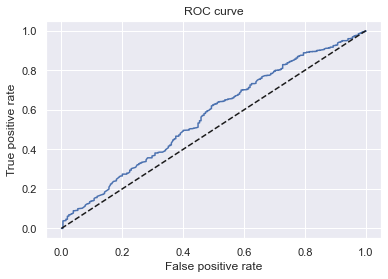

In [190]:
plt.plot(fpr, tpr)
# We plot the false positive rate along the x-axis and the true positive rate along the y-axis,
# thus plotting the ROC curve.
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
# We plot a seconary diagonal line, with dashed line style and black color.
plt.xlabel('False positive rate')
# We name the x-axis "False positive rate".
plt.ylabel('True positive rate')
# We name the x-axis "True positive rate".
plt.title('ROC curve')
# We name the graph "ROC curve".

In [191]:
AUROC = roc_auc_score(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])
# Calculates the Area Under the Receiver Operating Characteristic Curve (AUROC)
# from a set of actual values and their predicted probabilities.
AUROC

0.5682167200459884

In [192]:
f_actual_predicted_probs = df_actual_predicted_probs.sort_values('y_hat_test_proba')
# Sorts a dataframe by the values of a specific column.

In [193]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
18156,0,0.872779,0
6512,1,0.886856,0
7023,1,0.862827,0
7408,1,0.880645,0
17362,1,0.852944,0


In [194]:
df_actual_predicted_probs = df_actual_predicted_probs.reset_index()
# We reset the index of a dataframe and overwrite it.

In [195]:
df_actual_predicted_probs['Cumulative N Population'] = df_actual_predicted_probs.index + 1
# We calculate the cumulative number of all observations.
# We use the new index for that. Since indexing in ython starts from 0, we add 1 to each index.
df_actual_predicted_probs['Cumulative N Good'] = df_actual_predicted_probs['loan_data_targets_test'].cumsum()
# We calculate cumulative number of 'good', which is the cumulative sum of the column with actual observations.
df_actual_predicted_probs['Cumulative N Bad'] = df_actual_predicted_probs['Cumulative N Population'] - df_actual_predicted_probs['loan_data_targets_test'].cumsum()
# We calculate cumulative number of 'bad', which is
# the difference between the cumulative number of all observations and cumulative number of 'good' for each row.

In [196]:
df_actual_predicted_probs['Cumulative Perc Population'] = df_actual_predicted_probs['Cumulative N Population'] / (df_actual_predicted_probs.shape[0])
# We calculate the cumulative percentage of all observations.
df_actual_predicted_probs['Cumulative Perc Good'] = df_actual_predicted_probs['Cumulative N Good'] / df_actual_predicted_probs['loan_data_targets_test'].sum()
# We calculate cumulative percentage of 'good'.
df_actual_predicted_probs['Cumulative Perc Bad'] = df_actual_predicted_probs['Cumulative N Bad'] / (df_actual_predicted_probs.shape[0] - df_actual_predicted_probs['loan_data_targets_test'].sum())
# We calculate the cumulative percentage of 'bad'.

Text(0.5, 1.0, 'Gini')

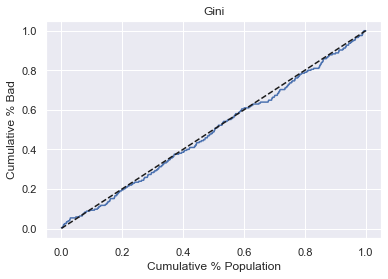

In [197]:
# Plot Gini
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Bad'])
# We plot the cumulative percentage of all along the x-axis and the cumulative percentage 'good' along the y-axis,
# thus plotting the Gini curve.
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Population'], linestyle = '--', color = 'k')
# We plot a seconary diagonal line, with dashed line style and black color.
plt.xlabel('Cumulative % Population')
# We name the x-axis "Cumulative % Population".
plt.ylabel('Cumulative % Bad')
# We name the y-axis "Cumulative % Bad".
plt.title('Gini')
# We name the graph "Gini".

In [198]:
Gini = AUROC * 2 - 1
# Here we calculate Gini from AUROC.
Gini

0.1364334400919769

### Creating Scorecard

In [199]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,0.474376,NaN
1,Age: 38-43,0.000060,0.999535
2,Age: 44-50,0.215515,0.043520
3,Age:> 50,0.176709,0.111346
4,numberOfDependents: 2,0.141863,0.110116
5,numberOfStaff: 1-2,0.031271,0.708668
6,Scoring_EducationLevel:College,0.601701,0.000094
7,Scoring_EducationLevel:High school,0.380734,0.000419
8,Scoring_businessType:Retail,0.209660,0.078680
9,Scoring_businessType:Service,0.375407,0.004847


In [200]:
ref_categories

['Age:< 38',
 'numberOfDependents: 1',
 'numberOfStaff: 3-5',
 'Scoring_EducationLevel:Primary',
 'Scoring_businessType:Manufacturing',
 'Scoring_BusinesSite:Market',
 'Scoring_MaritalStatus:widowed',
 'Scoring_HouseOwnership:Family',
 'numberOfDependents: 0',
 'numberOfStaff: 0',
 'numberOfStaff: 6+',
 'Scoring_EducationLevel:Secondary',
 'Scoring_businessType:Other',
 'Scoring_BusinesSite:Other']

In [201]:
df_ref_categories = pd.DataFrame(ref_categories, columns = ['Feature name'])
# We create a new dataframe with one column. Its values are the values from the 'reference_categories' list.
# We name it 'Feature name'.
df_ref_categories['Coefficients'] = 0
# We create a second column, called 'Coefficients', which contains only 0 values.
df_ref_categories['p_values'] = np.nan
# We create a third column, called 'p_values', with contains only NaN values.
df_ref_categories

,Feature name,Coefficients,p_values
0,Age:< 38,0,NaN
1,numberOfDependents: 1,0,NaN
2,numberOfStaff: 3-5,0,NaN
3,Scoring_EducationLevel:Primary,0,NaN
4,Scoring_businessType:Manufacturing,0,NaN
5,Scoring_BusinesSite:Market,0,NaN
6,Scoring_MaritalStatus:widowed,0,NaN
7,Scoring_HouseOwnership:Family,0,NaN
8,numberOfDependents: 0,0,NaN
9,numberOfStaff: 0,0,NaN


In [202]:
df_scorecard = pd.concat([summary_table, df_ref_categories])
# Concatenates two dataframes.
df_scorecard = df_scorecard.reset_index()
# We reset the index of a dataframe.
df_scorecard

,index,Feature name,Coefficients,p_values
0,0,Intercept,0.474376,NaN
1,1,Age: 38-43,0.000060,0.999535
2,2,Age: 44-50,0.215515,0.043520
3,3,Age:> 50,0.176709,0.111346
4,4,numberOfDependents: 2,0.141863,0.110116
5,5,numberOfStaff: 1-2,0.031271,0.708668
6,6,Scoring_EducationLevel:College,0.601701,0.000094
7,7,Scoring_EducationLevel:High school,0.380734,0.000419
8,8,Scoring_businessType:Retail,0.209660,0.078680
9,9,Scoring_businessType:Service,0.375407,0.004847


In [203]:
df_scorecard['Original feature name'] = df_scorecard['Feature name'].str.split(':').str[0]
# We create a new column, called 'Original feature name', which contains the value of the 'Feature name' column,
# up to the column symbol.
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name
0,0,Intercept,0.474376,NaN,Intercept
1,1,Age: 38-43,0.000060,0.999535,Age
2,2,Age: 44-50,0.215515,0.043520,Age
3,3,Age:> 50,0.176709,0.111346,Age
4,4,numberOfDependents: 2,0.141863,0.110116,numberOfDependents
5,5,numberOfStaff: 1-2,0.031271,0.708668,numberOfStaff
6,6,Scoring_EducationLevel:College,0.601701,0.000094,Scoring_EducationLevel
7,7,Scoring_EducationLevel:High school,0.380734,0.000419,Scoring_EducationLevel
8,8,Scoring_businessType:Retail,0.209660,0.078680,Scoring_businessType
9,9,Scoring_businessType:Service,0.375407,0.004847,Scoring_businessType


In [204]:
min_score = 0
max_score = 1000

In [205]:
df_scorecard.groupby('Original feature name')['Coefficients'].min()
# Groups the data by the values of the 'Original feature name' column.
# Aggregates the data in the 'Coefficients' column, calculating their minimum.

Original feature name
Age                       0.000000
Intercept                 0.474376
Scoring_BusinesSite       0.000000
Scoring_EducationLevel    0.000000
Scoring_HouseOwnership    0.000000
Scoring_MaritalStatus     0.000000
Scoring_businessType      0.000000
numberOfDependents        0.000000
numberOfStaff             0.000000
Name: Coefficients, dtype: float64

In [206]:
min_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].min().sum()
# Up to the 'min()' method everything is the same as in te line above.
# Then, we aggregate further and sum all the minimum values.
min_sum_coef

0.4743763892221613

In [207]:
df_scorecard.groupby('Original feature name')['Coefficients'].max()
# Groups the data by the values of the 'Original feature name' column.
# Aggregates the data in the 'Coefficients' column, calculating their maximum.

Original feature name
Age                       0.215515
Intercept                 0.474376
Scoring_BusinesSite       0.355312
Scoring_EducationLevel    0.601701
Scoring_HouseOwnership    0.267517
Scoring_MaritalStatus     0.437491
Scoring_businessType      0.375407
numberOfDependents        0.141863
numberOfStaff             0.031271
Name: Coefficients, dtype: float64

In [208]:
max_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].max().sum()
# Up to the 'min()' method everything is the same as in te line above.
# Then, we aggregate further and sum all the maximum values.
max_sum_coef

2.900453836331463

In [209]:
df_scorecard['Score - Calculation'] = df_scorecard['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)
# We multiply the value of the 'Coefficients' column by the ration of the differences between
# maximum score and minimum score and maximum sum of coefficients and minimum sum of cefficients.
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,0.474376,NaN,Intercept,195.532253
1,1,Age: 38-43,0.000060,0.999535,Age,0.024739
2,2,Age: 44-50,0.215515,0.043520,Age,88.832870
3,3,Age:> 50,0.176709,0.111346,Age,72.837175
4,4,numberOfDependents: 2,0.141863,0.110116,numberOfDependents,58.474083
5,5,numberOfStaff: 1-2,0.031271,0.708668,numberOfStaff,12.889503
6,6,Scoring_EducationLevel:College,0.601701,0.000094,Scoring_EducationLevel,248.013733
7,7,Scoring_EducationLevel:High school,0.380734,0.000419,Scoring_EducationLevel,156.933896
8,8,Scoring_businessType:Retail,0.209660,0.078680,Scoring_businessType,86.419467
9,9,Scoring_businessType:Service,0.375407,0.004847,Scoring_businessType,154.738461


In [210]:
df_scorecard['Score - Calculation'][0] = ((df_scorecard['Coefficients'][0] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score
# We divide the difference of the value of the 'Coefficients' column and the minimum sum of coefficients by
# the difference of the maximum sum of coefficients and the minimum sum of coefficients.
# Then, we multiply that by the difference between the maximum score and the minimum score.
# Then, we add minimum score. 
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,0.474376,NaN,Intercept,0.000000
1,1,Age: 38-43,0.000060,0.999535,Age,0.024739
2,2,Age: 44-50,0.215515,0.043520,Age,88.832870
3,3,Age:> 50,0.176709,0.111346,Age,72.837175
4,4,numberOfDependents: 2,0.141863,0.110116,numberOfDependents,58.474083
5,5,numberOfStaff: 1-2,0.031271,0.708668,numberOfStaff,12.889503
6,6,Scoring_EducationLevel:College,0.601701,0.000094,Scoring_EducationLevel,248.013733
7,7,Scoring_EducationLevel:High school,0.380734,0.000419,Scoring_EducationLevel,156.933896
8,8,Scoring_businessType:Retail,0.209660,0.078680,Scoring_businessType,86.419467
9,9,Scoring_businessType:Service,0.375407,0.004847,Scoring_businessType,154.738461


In [211]:
df_scorecard['Score - Preliminary'] = df_scorecard['Score - Calculation'].round()
# We round the values of the 'Score - Calculation' column.
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary
0,0,Intercept,0.474376,NaN,Intercept,0.000000,0.0
1,1,Age: 38-43,0.000060,0.999535,Age,0.024739,0.0
2,2,Age: 44-50,0.215515,0.043520,Age,88.832870,89.0
3,3,Age:> 50,0.176709,0.111346,Age,72.837175,73.0
4,4,numberOfDependents: 2,0.141863,0.110116,numberOfDependents,58.474083,58.0
5,5,numberOfStaff: 1-2,0.031271,0.708668,numberOfStaff,12.889503,13.0
6,6,Scoring_EducationLevel:College,0.601701,0.000094,Scoring_EducationLevel,248.013733,248.0
7,7,Scoring_EducationLevel:High school,0.380734,0.000419,Scoring_EducationLevel,156.933896,157.0
8,8,Scoring_businessType:Retail,0.209660,0.078680,Scoring_businessType,86.419467,86.0
9,9,Scoring_businessType:Service,0.375407,0.004847,Scoring_businessType,154.738461,155.0


In [212]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].min().sum()
# Groups the data by the values of the 'Original feature name' column.
# Aggregates the data in the 'Coefficients' column, calculating their minimum.
# Sums all minimum values.
min_sum_score_prel

0.0

In [213]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].max().sum()
# Groups the data by the values of the 'Original feature name' column.
# Aggregates the data in the 'Coefficients' column, calculating their maximum.
# Sums all maximum values.
max_sum_score_prel

999.0

In [214]:
df_scorecard['Difference'] = df_scorecard['Score - Preliminary'] - df_scorecard['Score - Calculation']
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,0,Intercept,0.474376,NaN,Intercept,0.000000,0.0,0.000000
1,1,Age: 38-43,0.000060,0.999535,Age,0.024739,0.0,-0.024739
2,2,Age: 44-50,0.215515,0.043520,Age,88.832870,89.0,0.167130
3,3,Age:> 50,0.176709,0.111346,Age,72.837175,73.0,0.162825
4,4,numberOfDependents: 2,0.141863,0.110116,numberOfDependents,58.474083,58.0,-0.474083
5,5,numberOfStaff: 1-2,0.031271,0.708668,numberOfStaff,12.889503,13.0,0.110497
6,6,Scoring_EducationLevel:College,0.601701,0.000094,Scoring_EducationLevel,248.013733,248.0,-0.013733
7,7,Scoring_EducationLevel:High school,0.380734,0.000419,Scoring_EducationLevel,156.933896,157.0,0.066104
8,8,Scoring_businessType:Retail,0.209660,0.078680,Scoring_businessType,86.419467,86.0,-0.419467
9,9,Scoring_businessType:Service,0.375407,0.004847,Scoring_businessType,154.738461,155.0,0.261539


## VII. Model with Decision Tree

### Preliminary tree

In [241]:
# Use the input dataframe with all the fields not excluding the reference characteristics since decision tree and random forest models 
# do not suffer from the colinearity problems. 

loan_data_map_filter_to_model_with_ref.head()

,Age:< 38,Age: 38-43,Age: 44-50,Age:> 50,numberOfDependents: 0,numberOfDependents: 1,numberOfDependents: 2,numberOfStaff: 0,numberOfStaff: 1-2,numberOfStaff: 3-5,numberOfStaff: 6+,Scoring_EducationLevel:College,Scoring_EducationLevel:High school,Scoring_EducationLevel:Primary,Scoring_EducationLevel:Secondary,Scoring_businessType:Manufacturing,Scoring_businessType:Other,Scoring_businessType:Retail,Scoring_businessType:Service,Scoring_businessType:Wholesale,Scoring_BusinesSite:Market,Scoring_BusinesSite:Mobile stall,Scoring_BusinesSite:Other,Scoring_BusinesSite:Store,Scoring_MaritalStatus:divorced,Scoring_MaritalStatus:married,Scoring_MaritalStatus:single,Scoring_MaritalStatus:widowed,Scoring_HouseOwnership:Family,Scoring_HouseOwnership:Owned,Scoring_HouseOwnership:Rent,Status
6,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,1
7,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,1
12,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1
13,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1
14,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0


In [242]:
loan_data_to_decision_tree_input = loan_data_map_filter_to_model_with_ref.drop('Status', axis=1)

In [243]:
loan_data_to_decision_tree_output = loan_data_map_filter_to_model_with_ref['Status']

In [244]:
X_train, X_test, y_train, y_test = train_test_split(loan_data_to_decision_tree_input, loan_data_to_decision_tree_output, test_size = 0.2)

In [245]:
## Create a decision tree and fit it to the training data
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn import metrics
clf_dt = DecisionTreeClassifier(random_state=42)
clf_dt = clf_dt.fit(X_train, y_train)

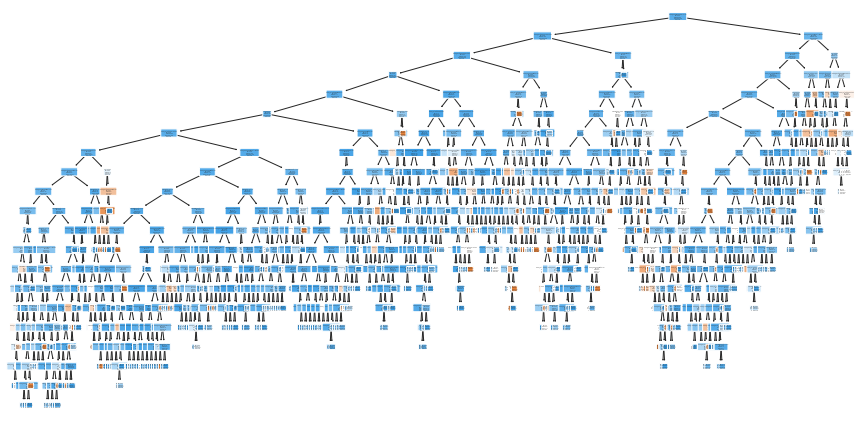

In [246]:
## plot out the tree to see what are the rules currently applied
from sklearn.tree import plot_tree
plt.figure(figsize=(15,7.5))
plot_tree(clf_dt,
          filled=True,
          rounded=True,
          class_names = ["No", "Yes"],
          feature_names = X_train.columns);

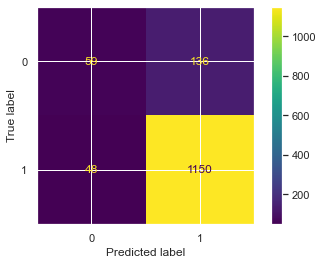

In [231]:
## plot_confusion_matrix() will run the test data down the tree and draw
## a confusion matrix

from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(clf_dt, X_test, y_test)

In [232]:
from sklearn.metrics import roc_auc_score

In [239]:
AUROC = roc_auc_score(y_test, clf_dt.predict_proba(X_test)[:, 1])
AUROC

0.7730234150935319

In [235]:
from sklearn.metrics import roc_curve

In [236]:
fpr, tpr, thresholds = roc_curve(y_test, clf_dt.predict_proba(X_test)[:, 1])
# Here we store each of the three arrays in a separate variable. 

Text(0.5, 1.0, 'ROC curve')

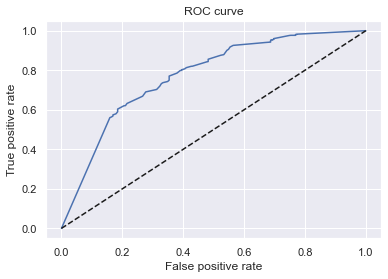

In [237]:
plt.plot(fpr, tpr)
# We plot the false positive rate along the x-axis and the true positive rate along the y-axis,
# thus plotting the ROC curve.
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
# We plot a seconary diagonal line, with dashed line style and black color.
plt.xlabel('False positive rate')
# We name the x-axis "False positive rate".
plt.ylabel('True positive rate')
# We name the x-axis "True positive rate".
plt.title('ROC curve')
# We name the graph "ROC curve".

In [240]:
Gini = AUROC * 2 - 1
# Here we calculate Gini from AUROC.
Gini

0.5460468301870638

### Cost Complexity Pruning the tree to Prevent Overfit

Decision Trees are notorious for being overfit to the Training Dataset. Pruning a decision tree is all about finding the right value for the pruning parameter, alpha, which controls how little or how much pruning happens. One way to find the optimal value for alpha is to plot the accuracy of the tree as a function of different values.

We'll do this for both the Training Dataset and the Testing Dataset.

First, let's extract the different values of alpha that are available for this tree and build a pruned tree for each value of alpha. NOTE: We omit the maximum value for alpha with ccp_alphas = ccp_alphas[:-1] because it would prune all leaves, leaving us with only a root instead of a tree.

In [247]:
path = clf_dt.cost_complexity_pruning_path(X_train, y_train) # determine values for alpha
ccp_alphas = path.ccp_alphas # extract different values for alpha
ccp_alphas = ccp_alphas[:-1] #exclude the maximum value for alpha

clf_dts = [] # create an array that we will put decision trees into

## now create one decision tree per value for alpha and store it in the array
for ccp_alpha in ccp_alphas:
    clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf_dt.fit(X_train, y_train)
    clf_dts.append(clf_dt)

In [248]:
## Here we graph the accuracy of the trees using the Training Dataset and the Testing dataset

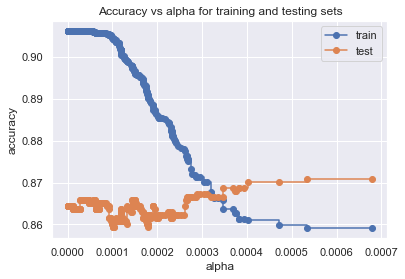

In [250]:
train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")

ax.plot(ccp_alphas, train_scores, marker ='o', label = "train", drawstyle = "steps-post")
ax.plot(ccp_alphas, test_scores, marker = 'o', label = "test", drawstyle = "steps-post")
ax.legend()
plt.show()

This approach uses only one dataset and more optimal approach must use a cross validation dataset.

<AxesSubplot:xlabel='alpha'>

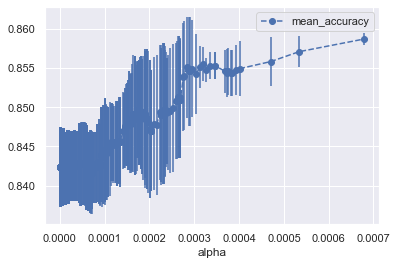

In [251]:
from sklearn.model_selection import cross_val_score

alpha_loop_values = []
# For each candidate value for alpha, we will rub 5-fold cross validation.
# Then we will store the mean and standard deviation of the scores (the accuracy) for each call
# to cross_va_score in alpha_loop_values...

for ccp_alpha in ccp_alphas:
    clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha = ccp_alpha)
    scores = cross_val_score(clf_dt, X_train, y_train, cv=5)
    alpha_loop_values.append([ccp_alpha, np.mean(scores), np.std(scores)])
    
# Now we can draw a graph of the means and the standard deviations of the scores
# for each candidate value for alpha

alpha_results = pd.DataFrame(alpha_loop_values,
                             columns = ['alpha', 'mean_accuracy', 'std'])

alpha_results.plot(x='alpha',
                   y='mean_accuracy',
                   yerr='std',
                   marker='o',
                   linestyle='--')

In [300]:
alpha_results[(alpha_results['alpha'] > 0.0003)
              & 
              (alpha_results['alpha'] < 0.0004)]

,alpha,mean_accuracy,std
346,0.000304,0.854193,0.005086
347,0.000312,0.855091,0.002687
348,0.000319,0.855450,0.002178
349,0.000327,0.854732,0.001503
350,0.000336,0.855271,0.001712
351,0.000346,0.855271,0.001712
352,0.000347,0.855271,0.001712
353,0.000369,0.854551,0.002708
354,0.000374,0.854371,0.003019
355,0.000375,0.854551,0.003000


In [302]:
ideal_ccp_alpha = alpha_results[(alpha_results['alpha'] > 0.00039)
              & 
              (alpha_results['alpha'] < 0.0004)]['alpha']
ideal_ccp_alpha

358    0.000393
Name: alpha, dtype: float64

In [303]:
ideal_ccp_alpha = float(ideal_ccp_alpha)

### Final Decision tree

In [304]:
clf_dt = DecisionTreeClassifier(random_state=42, ccp_alpha = ideal_ccp_alpha)
clf_dt = clf_dt.fit(X_train, y_train)

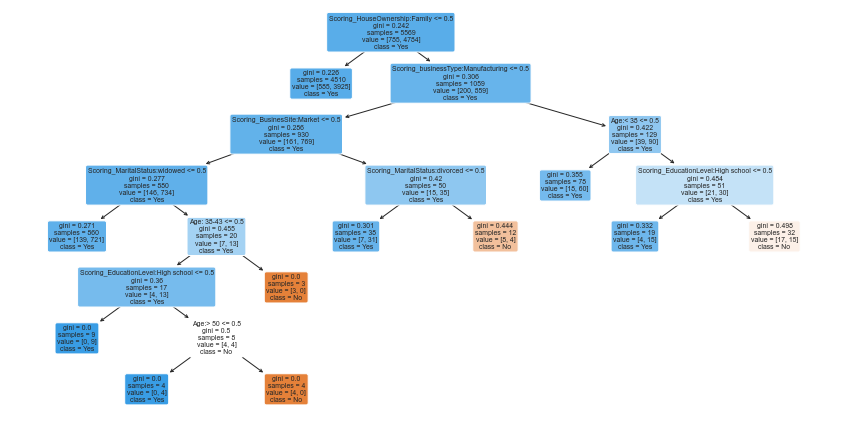

In [305]:
## plot out the tree to see what are the rules currently applied
from sklearn.tree import plot_tree
plt.figure(figsize=(15,7.5))
plot_tree(clf_dt,
          filled=True,
          rounded=True,
          class_names = ["No", "Yes"],
          feature_names = X_train.columns);

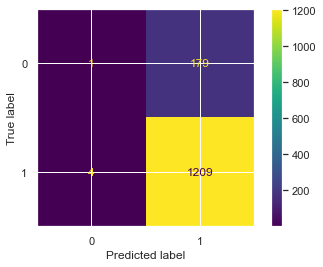

In [306]:
## plot_confusion_matrix() will run the test data down the tree and draw
## a confusion matrix

from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(clf_dt, X_test, y_test)

In [307]:
from sklearn.metrics import roc_auc_score

In [308]:
AUROC = roc_auc_score(y_test, clf_dt.predict_proba(X_test)[:, 1])
AUROC

0.516845287166804

In [309]:
from sklearn.metrics import roc_curve

In [310]:
fpr, tpr, thresholds = roc_curve(y_test, clf_dt.predict_proba(X_test)[:, 1])
# Here we store each of the three arrays in a separate variable. 

Text(0.5, 1.0, 'ROC curve')

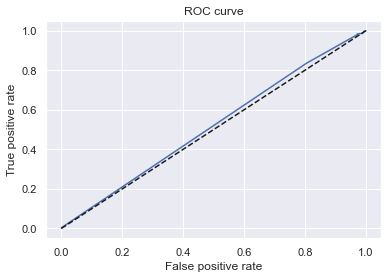

In [311]:
plt.plot(fpr, tpr)
# We plot the false positive rate along the x-axis and the true positive rate along the y-axis,
# thus plotting the ROC curve.
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
# We plot a seconary diagonal line, with dashed line style and black color.
plt.xlabel('False positive rate')
# We name the x-axis "False positive rate".
plt.ylabel('True positive rate')
# We name the x-axis "True positive rate".
plt.title('ROC curve')
# We name the graph "ROC curve".

In [312]:
Gini = AUROC * 2 - 1
# Here we calculate Gini from AUROC.
Gini

0.033690574333608